In [ ]:
# MIT License
#
#@title Copyright (c) 2023 CCAI Community Authors { display-mode: "form" }
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

# Aquaculture Mapping: Detecting and Classifying Aquaculture Ponds using Deep Learning
Author(s):
*   Joshua Cortez, Thinking Machines Data Science
  - Email: joshuacortez@thinkingmachin.es
*   JC Nacpil, Thinking Machines Data Science
  - Email: jcnacpil@thinkingmachin.es

Welcome to CCAI's tutorial on aquaculture mapping using deep learning. This notebook will demonstrate how we can use deep learning to detect and classify aquaculture ponds based on their production intensity. You will also learn how we can use Lightning with PyTorch to make more reproducible deep learning workflows.

You can make a copy of this tutorial by clicking File→Save a copy in Drive.

# Table of Contents


*   [Overview](#overview)
*   [Climate Impact](#climate-impact)
*   [Target Audience](#target-audience)
*   [Background & Prerequisites](#background-and-prereqs)
*   [Software Requirements](#software-requirements)
*   [Data Description](#data-description)
*   [Methodology](#methodology)
*   [Results & Discussion](#results-and-discussion)
*   [References](#references)


<a name="overview"></a>
# Overview

In this tutorial, users will learn the following:
- The relevance of aquaculture ponds in climate adaptation
- Mapping and classifying aquaculture ponds based on their production intensity
- Using PyTorch Lightning to train and rollout a semantic segmentation model

This tutorial will also discuss the following datasets that are openly-available for research purposes
- High-resolution (4.77m) Planetscope imagery provided by Norway's International Climate and Forest Initiative (NICFI)
- Aquaculture Classification dataset for Philippines and Indonesia, developed by Thinking Machines Data Science


<a name="climate-impact"></a>
# Climate Impact
Asia has seen a massive growth of its aquaculture sector since the late 1990s, holding up to 90% of the industry today. With the growing demand of seafood and aquaculture products, it is forecasted that here will be a projected growth of 21.6% for the industry by 2030 compared to production from 2020.

However, this growth has come at the expense of marine resources, with natural ecosystems like mangroves losing forest cover due to aquaculture farming and land-use change. In Southeast Asia alone, up to 30% of mangrove loss from 2000 to 2012 was due to aquaculture farming. Mangroves are known as a key “nature-based” solution to the climate crisis, as they store and sequester large amounts of carbon, host rich ecosystems, and protect coastal communities from the impact of storm surges and other extreme weather events. This makes preventing the loss of mangroves much more important in the wake of aquaculture sector’s rapid growth. On the other hand, food security remains a priority for sustainable development, and so finding a balance between mangrove restoration and aquaculture intensification is key.

Thus, mapping out these aquaculture ponds is essential for better environmental monitoring, conservation and climate adaptation efforts. For example, finding extensive ponds that have the potential to be restored into mangroves can help inform decisions on where to deploy restoration projects. Monitoring changes in production intensity over time can also clue us in which areas that are most impacted by highly-intensified aquaculture.


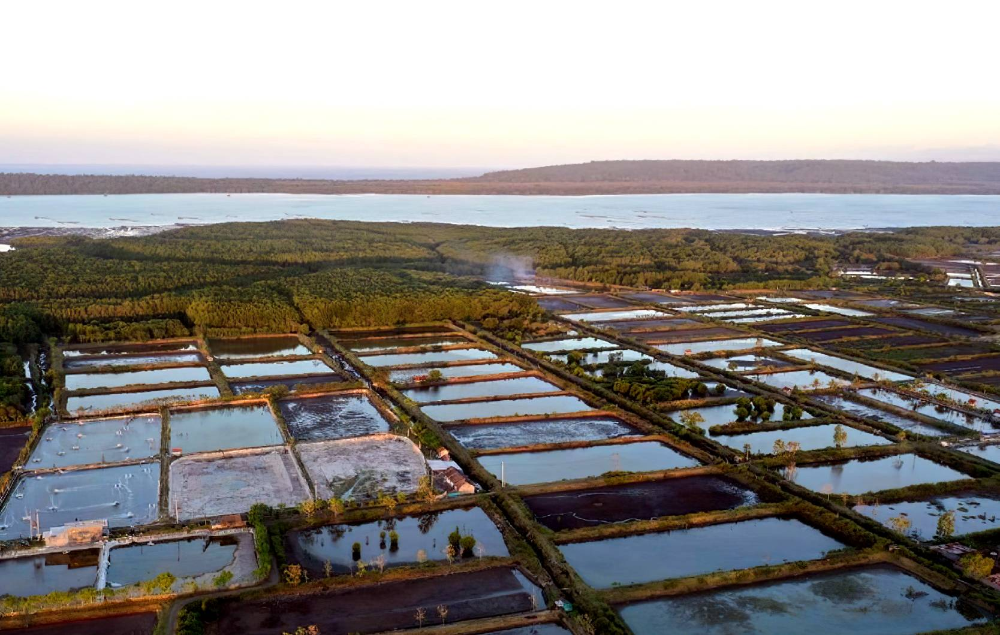

## Climate Smart Shrimp Program

We worked with the environmental non-profit [Conservation International](https://www.conservation.org/) (CI) to support their [Climate Smart Shrimp (CSS)](https://www.conservation.org/docs/default-source/publication-pdfs/climatesmartshrimp_fact_sheet_200309.pdf?sfvrsn=30cea3b4_2) program. The core idea of the CSS project is green-gray aquaculture, wherein the aquaculture ponds are smartly designed to effectively restore mangroves for mitigating environmental risks while accommodating the intensification needs of aquaculture producers. CI works with with aquaculture farmers around the world to adopt this paradigm, with the vision that profits from responsible intensification on a small portion of the farm will help fund mangrove restoration on the remainder of the farm. Being able to identify aquaculture ponds as viable restoration sites could vastly increase the potential area of mangrove restoration across Southeast Asia and other production geographies.

However, a key challenge for this project is finding the right aquaculture sites that are suitable for this kind of infrastucture. In particular, it is important for CSS to not only know the location of aquaculture sites but also its intensification class. As will be discussed later on, their are two main types of ponds (extensive and intensive) based on their intensification level.

In this tutorial, we will share some of the methods we developed to quickly identify extensive and intensive aquaculture ponds through deep learning. This ability to quickly pinpoint these viable areas was key in helping CI in their site-prioritization efforts for CSS and fast-track their efforts to implement green-gray aquaculture in pilot sites.

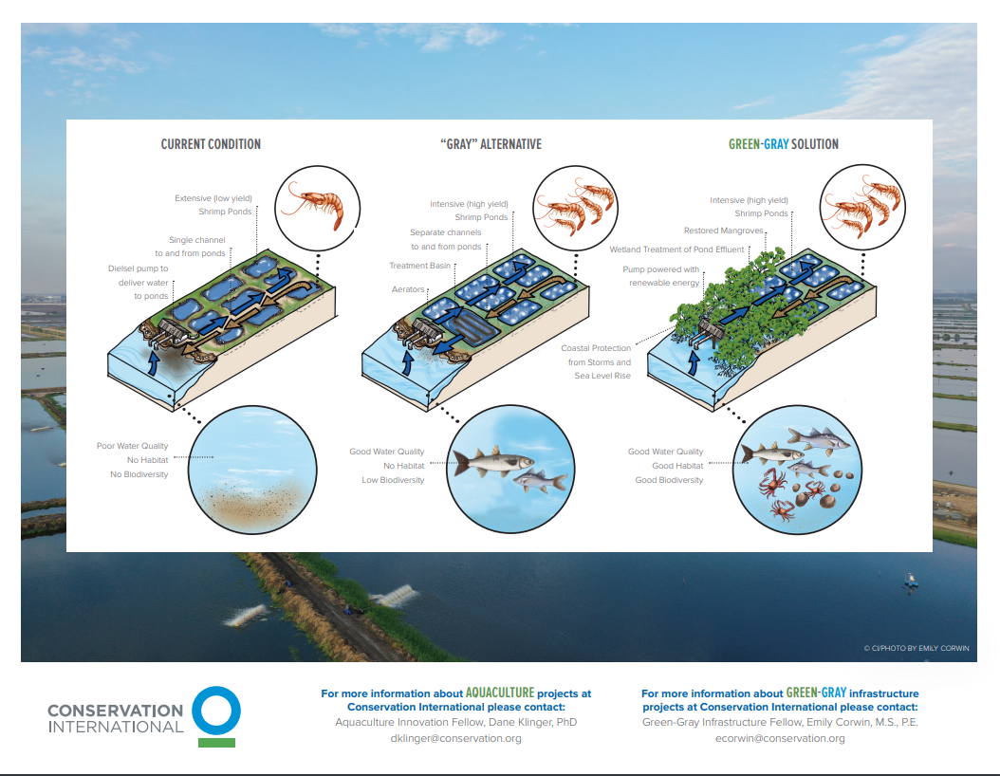

<a name="target-audience"></a>
# Target Audience

The primary targets for this tutorial are data scientists, researchers and developers of all levels within computer vision, earth observation and related geospatial industries. In particular, those working in aquaculture, conservation, climate adaptation, and land use planning can benefit in learning more about the climate impact of aquaculture ponds and how we can reliably map and classify these using satellite imagery.



<a name="background-and-prereqs"></a>
# Background & Prerequisites

We expect the audience to have a basic understanding of GIS and machine learning to make the most out of this tutorial, specifically
- Satellite image processing
- Computer vision concepts, espeically semantic segmentation
- PyTorch or equivalent machine learning frameworks

Beginners are also welcome as the tutorial will be designed to gently introduce high-level concepts in aquaculture and CV for their appreciation.

## Videos

For more information, you can view the following videos about on the following concepts:
*   Impact of shrimp aquaculture on the environment
*   Conservation International's Climate Smart Shrimp program
*   PyTorch Lightning Machine Learning Framework

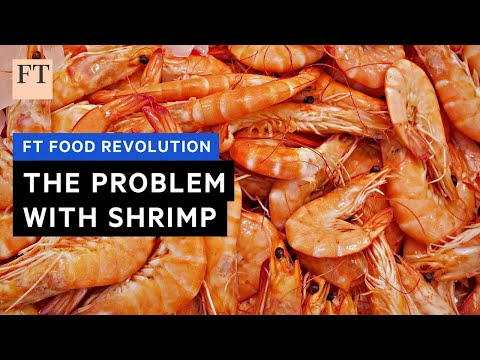

In [ ]:
from IPython.display import YouTubeVideo
YouTubeVideo('YvCyn5qn6dg')

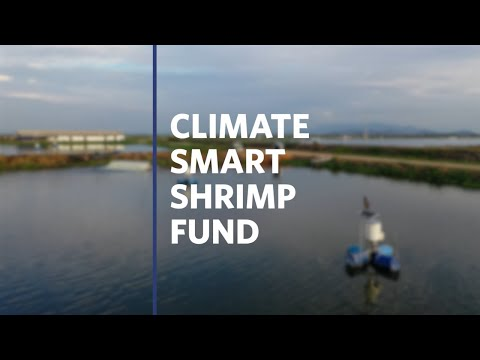

In [ ]:
YouTubeVideo('tFOXy6Kas_c')

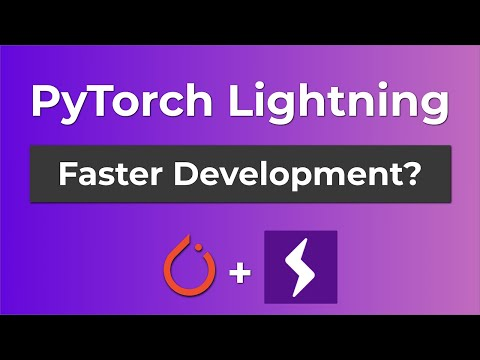

In [ ]:
YouTubeVideo('Hgg8Xy6IRig')

<a name="software-requirements"></a>
# Software Requirements
The Python version at the time of this submission in Colab = Python 3.10.12.

The notebooks makes use of the following libraries for these tasks:
*   Input / Output: `pathlib`, `PIL`, `typing`, `os`
*   Logging: `loguru`, `tqdm`
*   Visualization: `matplotlib`, `folium`
*   Data manipulation: `pandas`, `numpy`
*   Raster processing: `rasterio`
*   Vector processing: `shapely`, `geopandas`
*   Model development: `torch`, `lightning`, `sklearn`

In [ ]:
!python --version

Python 3.10.12


In [ ]:
%%capture
!pip -q install rasterio
!pip -q install loguru
!pip -q install lightning
!pip -q install segmentation_models_pytorch
!pip -q install geowrangler
!pip -q install mapclassify

### Initial Imports

In [ ]:
# Input / Output
from pathlib import Path
from PIL import Image
from typing import Any, Dict, Iterator, List, Optional, Tuple, Union
import os

# Logging
from loguru import logger
from tqdm import tqdm

# Data visualization
import matplotlib.pyplot as plt
from matplotlib import colors
import folium

# Data manipulation
import pandas as pd
import numpy as np

# Raster processing
import rasterio as rio
from rasterio.plot import show

# Vector processing
import geopandas as gpd
from shapely.geometry import Polygon, box

# Model development
import torch
from torch.utils.data import DataLoader, Dataset


<a name="data-description"></a>
# Data Description



### NICFI

For this tutorial, we will be using openly-available satellite images (<5m) provided by Norway’s International Climate and Forests Initiative (NICFI) satellite program, as of July 2022. We will be using images over aquaculture areas

The NICFI program  aims to reduce and reverse tropical deforestation by providing analysis-ready high-resolution satellite imagery over the tropics. These images are based on remote sensing data from the PlanetScope constellation of approximately 130 satellites (Planet Team, 2017). As of writing, NICFI-provided images have a resolution of 4.77m (coordinate system: EPSG:4326), contain 4 spectral bands (red, green, blue, and near-infrared), express data as 16-bit values, and are served on a monthly-aggregated basis from September 2020 to August 2022. In this work, we used satellite imagery for July 2022, which was the latest available imagery at the time.

![The NICFI dataset covers pantropical areas](https://miro.medium.com/v2/resize:fit:1400/0*dptPYcb9lGbhJqsL)

### Classifying aquaculture ponds by production intensity

One way to classify aquaculture is to look at their production intensity, or how optimized the pond is to produce fish, shrimp, and other aquatic livestock.
In this view, we can broadly classify ponds as 1 or 2 types, either "extensive" or "intensive"
- **Extensive ponds** are characterized by relying on natural productivity of the water body, and thus are less densely stocked and often don’t have machinery present.
- On the other hand, **intensive ponds** are characterized by having higher yields per unit area due to capital investments in technology such as aerators.

Production intensity is key characterestic to understanding an aquaculture farm, its activities, and its impact on the environment. For example, smallholder fishfarmers often rely on extensive ponds as they do not generate enough income to intensify, and thus their activities are quite labor intensive.

Intensifying aquaculture production boosts the yield, efficiency, and economic impact of the pond, but at the cost of has negative effects on the downstream ecosystem. Intensive ponds often have poor waste management, produce heightened emissions, and are constructed at the expense of marshes, mangroves, and other ecologically-important areas. They can also destroy habitats in natural waters by introducing genetically-transformed, exotic, or invasive fish species

> Note: there are other types of aquaculture ponds that fall somewhere between these two categories, such as silvoaquaculture and semi-intensive ponds, but we will not be tackling them for this tutorial.





<img src="https://drive.google.com/uc?export=view&id=1Rh6v62B5gkm9B0a9JSvzlC7okGBZSnI9" height="400">

One important thing to highlight is that the characteristics of extensive and intensive pond also makes them very visually distinct from one another, which can be seen even when viewing from satellite imagery.
- Extensive ponds are visually characterized by irregular boundaries and large area extent.
- We can conversely identify an intensive pond by its regular boundaries, smaller area extent, and presence of white swirls produced by aerators.

Thus, this presents the possibility for us to identify and classify ponds by their production intensity using computer vision and satellite imagery!

### Using Semantic Segmentation to Classify Aquaculture Ponds

In computer vision, semantic segmentation is the process of classifying each pixel in an image. Each pixel is assigned a class. The array of pixel classifications is called an image mask. The image below shows an image of cyclists and the corresponding image mask.

<img src="https://www.jeremyjordan.me/content/images/2018/05/Screen-Shot-2018-05-17-at-7.42.16-PM.png" height = "300">

For our use case, there are 3 relevant classes:
- Intensive Pond
- Extensive Pond
- Background (i.e. it's niether an intensive pond nor extensive pond)

The image below shows the semantic segmentation predictions along a coast in Indonesia. The blue shapes correspond to intensive ponds, and the green shapes correspond to extensive ponds. By the end of this tutorial, you will be equipped how to replicate this on your own!

![aquaculture predictions](https://raw.githubusercontent.com/thinkingmachines/aquafarm-segmentation/main/assets/sample_model_predictions.png)


### Image Chipping

Before we train a semantic segmentation model, we first need to prepare the training data. For computer vision on satellite imagery, satellite images are typically chipped into smaller images of a fixed length and width. This is necessary so that the images fit within the expected dimensions of most computer vision deep learning models. Each image chip is paired with its corresponding mask.

The image below is an example of image chipping.

<img src="https://miro.medium.com/v2/0*vCI9h9dv1GEVIyZz" width="400">

For this tutorial, we have already prepared the chipped NICFI images and their corresponding mask. Each image is 128 by 128 pixels. Each mask is also 128 by 128 pixels. In the next section you will download the image and mask pairs for model training.

<a name="quadkey-explanation"></a>
### [Optional Reading] How were the image and mask pairs prepared?

For the scope of this tutorial, we have ready-made training dataset prepared for you. But how did we prepare this dataset to begin with?

#### Preparing the chipped images
We used [Web Mercator quadkeys](https://learn.microsoft.com/en-us/bingmaps/articles/bing-maps-tile-system) as our primary basis for the image chips. More specifically, we used zoom level 16, which approximately 2.3887 meters per pixel. This was especially convenient since the NICFI images were also using the Web Mercator projection. Hence, the gridding lined up perfectly with the NICFI images, resulting in a clean 128 by 128 chipping, without any exceess edges or gaps. Each image chip also has a 16-digit unique ID called the quadkey. We use the quadkey as our main reference.

Below is an example of zoom levels 1 to 3 and their corresponding quadkeys.
<img src="https://learn.microsoft.com/en-us/bingmaps/articles/media/5cff54de-5133-4369-8680-52d2723eb756.jpg" height="300">

Using this grid system, we can see how each grid cell can be specified by its x and y location, starting from the bottom left. For example, in level 3 quadkeys, the quadkey `222` is in the x-y position (0,0), `223` is in (0,1), `220` in (1,0), and so on. As we will show in later sections on polygonization, the quadkey also specifies the x/y position using a straightforward conversion, which is very useful for grid calculations! In this tutorial, we use it to determine clusters of neighboring grids.

#### Preparing the masks
The masks originated from vector polygons. The polygons were manually drawn by a team of annotators. Each polygon corresponds to a pond and its classification. The polygons were rasterized to become 128 by 128 pixel masks.

![rasterization](https://desktop.arcgis.com/en/arcmap/latest/extensions/arcglobe/GUID-0E3D651A-34B6-44D2-AE29-B527B86547A1-web.gif)

## Data Download
Provide instructions on how to retrieve the necessary data.

This may include bash scripts, Python scripts, or other means of downloading the data.


We download the zip file from Google Drive and unzip it.

In [ ]:
!gdown https://drive.google.com/uc?id=1PAiNz9GeocjSX9Z_feCLpo0TUemZ3dWK

Downloading...
From: https://drive.google.com/uc?id=1PAiNz9GeocjSX9Z_feCLpo0TUemZ3dWK
To: /content/ccai2023_pond_segmentation_tutorial_data.zip
100% 2.89G/2.89G [00:24<00:00, 120MB/s]


In [ ]:
!unzip -oq /content/ccai2023_pond_segmentation_tutorial_data.zip

## Setting Global Variables

In [ ]:
DATA_PATH = Path("ccai2023_pond_segmentation_tutorial_data")
TRAINING_DATA_PATH = DATA_PATH / "training_data"
ROLLOUT_DATA_PATH = DATA_PATH / "rollout_data"

## Data Preprocessing
Additionally, you can include any data preprocessing steps and exploratory data analyses (e.g. visualize data distributions, impute missing values, etc.) in this section to allow the users to better understand the dataset.

In this section, you might also want to describe the different input and output variables, the train/val/test splits, and any data transformations.

Notice that both the images and masks are saved as `.tif` files instead of the typical `.png` or `.jpg` files in computer vision model training. This is because our images are [georeferenced](https://en.wikipedia.org/wiki/Georeferencing). We open the `.tif` files using `rasterio`.

Each image and mask also comes with a 16-digit identifier called a quadkey. For example, for quadkey `3100131030330020`
- The image is `3100131030330020.tif`
- The mask is `3100131030330020-mask.tif`

In [ ]:
model_tiles = list((TRAINING_DATA_PATH/"model_tiles").glob("**/*.tif"))
model_tiles[:5]

[PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles/3101020323210230.tif'),
 PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles/3101013002020133.tif'),
 PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles/1323211101221102.tif'),
 PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles/1323211101330203.tif'),
 PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles/1322231203303331.tif')]

In [ ]:
annotation_masks = list((TRAINING_DATA_PATH/"annotation_masks").glob("**/*.tif"))
annotation_masks[:5]

[PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/annotation_masks/3100130133033130-mask.tif'),
 PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/annotation_masks/3101012312212333-mask.tif'),
 PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/annotation_masks/3101012112012130-mask.tif'),
 PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/annotation_masks/3101012300201103-mask.tif'),
 PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/annotation_masks/1323302320210233-mask.tif')]

Let's visualize one quadkey using `rasterio`

In [ ]:
# Find values with full range of unique values
for annotation_mask in annotation_masks:
  with rio.open(annotation_mask) as image:
    unique_vals = np.unique(image.read())
    # if np.array_equal(unique_vals, np.array([0,1,2])):
    if len(unique_vals) > 2:
      print(annotation_mask, unique_vals)
      break

ccai2023_pond_segmentation_tutorial_data/training_data/annotation_masks/1323302320210233-mask.tif [0 1 2]


In [ ]:
test_quadkey = "3101020230101122"
test_annotation_mask = TRAINING_DATA_PATH/f"annotation_masks/{test_quadkey}-mask.tif"
test_model_tile = TRAINING_DATA_PATH/ f"model_tiles/{test_quadkey}.tif"

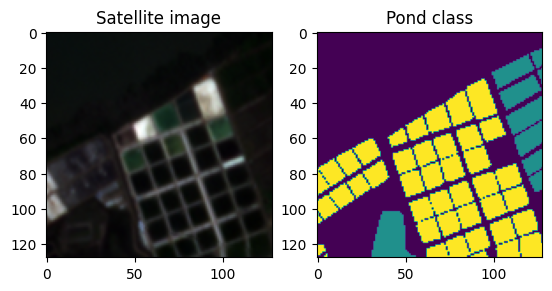

In [ ]:
fig, axes = plt.subplots(1,2)
with rio.open(test_model_tile) as image:
  data = image.read((1,2,3))
  show(data, adjust=True, ax=axes[0])
with rio.open(test_annotation_mask) as image:
  show(image.read(), ax=axes[1])
axes[0].set_title("Satellite image")
axes[1].set_title("Pond class")
fig.show()

<a name="methodology"></a>
# Methodology

In this section, describe a step-by-step walkthrough of the methodology, in the form of code cells. Feel free to make use of markdown headings to break this section up into smaller subsections, preferrably one section per task.

Reminders:
*   Split the code into small, digestible chunks.
*   Use text cells to describe each code block.
*   Avoid duplicate code through modularization.

# Setting up the Data

## The PyTorch Dataset

The first step in training a deep learning model in PyTorch is defining the PyTorch `Dataset` class. This class is responsible for
1. Reading the images and masks from disk
2. Data preprocessing (e.g. 16-bit normalization, data augmentation)
3. Returning the data as well-formatted PyTorch tensors ready for the model

In the next section we'll be defining the `PondDataset`, which is inherits from the base `Dataset` class. Before diving in how the `PondDataset` is exactly defined, we will first demonstrate what it can do first.

### Setting up utility functions

First we define utility functions that will be used by `PondDataset`.

1. Image transformation utilities
  - Image Normalization
  - Data Augmentation
2. Data utilities
3. Plotting utilities

Below we also demonstrate each utility function with a test case.

<b> Feel free to skip and come back to this later after you get an intuitive understanding of what `PondDataset` is expected to do! </b>

First we import the necessary libraries for our utility functions

In [ ]:
from functools import partial
from typing import Any, Callable, Dict, List, Optional

import albumentations as A
import numpy as np
from loguru import logger
from torchvision.transforms import Normalize

Here we define functions to normalize the image. This is necessary for both the following:
1. Making 16-bit images look more "similar" to 8-bit images. This will be discussed in more detail later.
2. Making input images to the model look more "similar" to ImageNet, because the model we're using was pretrained on ImageNet

In [ ]:
def normalize_func_numpy(img: np.array, means: np.array, stdevs: np.array) -> np.array:
    img = (img - means) / stdevs
    return img


def build_normalizing_transform(
    means: List[float] = [0.485, 0.456, 0.406],
    stdevs: List[float] = [0.229, 0.224, 0.225],
    is_inverse: bool = False,
    is_numpy: bool = False,
) -> Callable:
    """
    Set up a normalizing transform based on the mean and standard deviation

    Default means and stdevs are based on imagenet statistics

    Optionally return the inverse transform

    Also optionally return a transform for numpy arrays instead of torch tensors
    """

    means = np.array(means).reshape(-1, 1, 1)
    stdevs = np.array(stdevs).reshape(-1, 1, 1)

    assert means.shape == stdevs.shape

    if is_inverse:
        means = -means / stdevs
        stdevs = 1 / stdevs

    if is_numpy:
        normalizing_transform = partial(
            normalize_func_numpy, means=means, stdevs=stdevs
        )
    else:
        normalizing_transform = Normalize(mean=means, std=stdevs)

    return normalizing_transform

In [ ]:
# making a single image with a given mean and standard deviation per channel
test_img = torch.normal(mean = 10, std = 2, size = (3, 128, 128))
test_mean = test_img.mean(axis = [1,2])
test_std = test_img.std(axis = [1,2])
test_mean, test_std

(tensor([ 9.9992, 10.0099, 10.0089]), tensor([2.0101, 1.9987, 1.9910]))

In [ ]:
# after normalizing using the same mean and standard deviation, the image has approx mean 0 and std 1
test_normalize = build_normalizing_transform(10, 2)
normalized_test_img = test_normalize(test_img)
normalized_test_img.mean(axis = [1,2]), normalized_test_img.std(axis = [1,2])

(tensor([-0.0004,  0.0050,  0.0045]), tensor([1.0050, 0.9994, 0.9955]))

Data augmentation can help reduce model overfitting. We define a utility function that can take on a list of augmentor names and it will return a function that applies all of those transformations.

In [ ]:
def build_augmentation_transforms(
    augmentors: Optional[List[str]],
) -> Optional[A.Compose]:
    if augmentors is None:
        return None

    augmentors_dict = {
        "Blur": A.Blur(),
        "RandomRotate90": A.RandomRotate90(),
        "HorizontalFlip": A.HorizontalFlip(),
        "VerticalFlip": A.VerticalFlip(),
        "GaussianBlur": A.GaussianBlur(),
        "GaussNoise": A.GaussNoise(),
        "RGBShift": A.RGBShift(),
        "ToGray": A.ToGray(),
    }

    aug_transforms = []
    for augmentor in augmentors:
        try:
            aug_transforms.append(augmentors_dict[augmentor])
        except KeyError as k:
            logger.warning(
                f"{k} is an unknown augmentor. Continuing without {k}. "
                f"Known augmentors are: {list(augmentors_dict.keys())}"
            )

    aug_transforms = A.Compose(aug_transforms)

    return aug_transforms

In [ ]:
test_img = np.array([[1., 0., 1.],
        [1., 0., 0.],
        [1., 1., 0.]])
test_img

array([[1., 0., 1.],
       [1., 0., 0.],
       [1., 1., 0.]])

In [ ]:
# there will be a 50% chance for each transform to be applied
test_aug_transforms = build_augmentation_transforms(augmentors = ["RandomRotate90","HorizontalFlip","VerticalFlip"])
test_aug_transforms(image = test_img)["image"]

array([[1., 1., 1.],
       [1., 0., 0.],
       [0., 0., 1.]])

This class is a modified version of the [`Subset`](https://pytorch.org/docs/stable/data.html#torch.utils.data.Subset) class in `PyTorch`, with the biggest difference with `use_aug_transforms` being available as an extra parameter.

We use `Subset` during the training and validation split. For the trianing set, we want to use data augmentation, but for the validation set we don't want to use data augmentation.

In [ ]:
from torch.utils.data import Dataset

class Subset(Dataset):
    """
    Subset of a dataset at specified indices.

    **Modified version of the Subset class in Pytorch**

    Args:
        dataset (Dataset): The whole Dataset
        indices (sequence): Indices in the whole set selected for subset
        use_aug_transforms (bool): whether or not to apply data augmentation
    """

    def __init__(self, dataset, indices, use_aug_transforms) -> None:
        self.dataset = dataset
        self.indices = indices
        self.use_aug_transforms = use_aug_transforms

    def __getitem__(self, idx):
        if isinstance(idx, list):
            idx = [self.indices[i] for i in idx]
        else:
            idx = self.indices[idx]

        return self.dataset.__getitem__(idx, self.use_aug_transforms)

    def __len__(self):
        return len(self.indices)


We define a utility function for plotting our images.
- The colormap or `cmap` is a mapping from class labels to colors.
- The `norm` is used to set the expected interval of values for assigning to the colormap. Here we set the class labels to be at the midpoint of each interval.

In [ ]:
from typing import Any, Dict, Tuple

from matplotlib import colors

def setup_cmap_and_norm(
    label_mapping: Dict[int, str],
    label_cmap: Dict[str, str],
) -> Tuple[Any]:
    cmap = colors.ListedColormap(
        colors=[label_cmap[label] for i, label in label_mapping.items()]
    )

    # actual labels should be in between the boundary values
    boundaries = [i for i in label_mapping.keys()]
    boundaries = [i - 0.5 for i in boundaries] + [boundaries[-1] + 0.5]
    norm = colors.BoundaryNorm(
        boundaries=boundaries,
        ncolors=len(label_mapping),
    )

    return cmap, norm


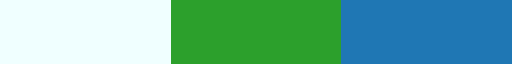

In [ ]:
# labels per class
test_label_mapping = {
    0: "background",
    1: "extensive",
    2: "intensive",
}

# color map for plotting
test_label_cmap = {
    "background": "azure",
    "extensive": "tab:green",
    "intensive": "tab:blue",
}

test_cmap, test_norm = setup_cmap_and_norm(label_mapping = test_label_mapping, label_cmap = test_label_cmap)
test_cmap

### Defining the `PondDataset` Class

<b> Feel free to come back to this later after getting an intuitive understanding of what `PondDataset` is expected to do! </b>

In [ ]:
import os
from pathlib import Path
from typing import Any, Dict, Iterator, List, Optional, Tuple, Union

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio as rio
import torch
from lightning import LightningDataModule
from loguru import logger
from matplotlib.patches import Patch
from rasterio.plot import show
from shapely.geometry import Polygon, box
from sklearn.model_selection import ShuffleSplit
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm

class PondDataset(Dataset):
    """
    Pytorch Dataset to read in satellite images and/or raster masks
    """

    def __init__(
        self,
        imgs_root: Union[str, Path],
        targets_root: Optional[Union[str, Path]] = None,
        mask_fname_suffix: Optional[str] = None,
        rescale_image_method: str = "normalize_clip_and_rescale",
        augmentors: Optional[List[str]] = None,
    ) -> None:
        self.imgs_root = Path(imgs_root)
        self.img_fname_suffix = ".tif"

        self.targets_root = targets_root
        if self.targets_root is not None:
            self.targets_root = Path(self.targets_root)

        self.mask_fname_suffix = mask_fname_suffix
        if self.mask_fname_suffix is None:
            self.mask_fname_suffix = "-mask.tif"

        # labels per class
        self.label_mapping = {
            0: "background",
            1: "extensive",
            2: "intensive",
        }

        self.NUM_CLASSES = len(self.label_mapping)

        self.BACKGROUND_PIXEL_VAL = 0

        # color map for plotting
        self.label_cmap = {
            "background": "azure",
            "extensive": "tab:green",
            "intensive": "tab:blue",
        }

        # get img ids from the filenames
        img_fnames = os.listdir(self.imgs_root)
        data_ids = [fname.replace(self.img_fname_suffix, "") for fname in img_fnames]

        data_ids = sorted(data_ids)
        self.data_ids = data_ids

        self.BAND_INDICES = [3, 2, 1]
        self.NUM_IN_CHANNELS = len(self.BAND_INDICES)
        self.RGB_INDICES = [3, 2, 1]

        self.RESCALE_IMAGE_METHOD = rescale_image_method
        # these are precomputed statistics based on the training set
        self.DATA_NORMALIZING_PARAMS = {
            "means": [459.06415365, 686.84029586, 568.45791792],
            "stdevs": [221.29763659, 249.20891633, 295.51260358],
        }

        self.data_normalize = build_normalizing_transform(
            means=self.DATA_NORMALIZING_PARAMS["means"],
            stdevs=self.DATA_NORMALIZING_PARAMS["stdevs"],
            is_numpy=True,
        )

        self.aug_transforms = build_augmentation_transforms(
            augmentors
        )

        self.crs = self._get_crs()

    def _get_crs(self) -> rio.CRS:
        """
        Get the CRS based on the first image's CRS

        Underlying assumping is that all tiles have the same CRS
        """
        data_id = self.data_ids[0]
        img_fpath, _ = self.get_img_and_mask_paths(data_id)
        with rio.open(img_fpath) as src:
            crs = src.crs

        return crs

    def _aug_transform(
        self, image: np.array, mask: Optional[np.array]
    ) -> Tuple[np.array, Optional[np.array]]:
        """
        Convenience function for using aug_transforms with and without a mask
        """

        ## channels should be last when doing augmentation (i.e. H x W x C)
        image = np.moveaxis(image, source=0, destination=-1)

        if mask is None:
            aug_transformed = self.aug_transforms(image=image)
            image = aug_transformed["image"]
        else:
            aug_transformed = self.aug_transforms(image=image, mask=mask)
            image = aug_transformed["image"]
            mask = aug_transformed["mask"]

        ## bring channels back to first to follow Pytorch format (i.e. C x W x H)
        image = np.moveaxis(image, source=-1, destination=0)

        return image, mask

    def _rescale_image(
        self,
        img: torch.Tensor,
        rescale_image_method: str = "normalize_clip_and_rescale",
    ) -> torch.Tensor:
        """
        Preprocesses images to have values between 0 and 1

        Option 1: MinMax Scaling (rescale_only)
        Option 2: Normalize, Clip, and MinMaxScale (normalize_clip_and_rescale)
        """

        assert rescale_image_method in ["rescale_only", "normalize_clip_and_rescale"]

        if rescale_image_method == "rescale_only":
            # this is based on the max values for the RGB bands
            # https://developers.google.com/earth-engine/datasets/catalog/projects_planet-nicfi_assets_basemaps_americas#bands
            # can also verify values using the find_min_max_pixel_values function
            MAX_IMG_VAL = 10_000

            img = img / MAX_IMG_VAL
        if rescale_image_method == "normalize_clip_and_rescale":
            # standard dev of 3 is a reasonable value
            MAX_STDEV = 3

            # normalize image
            img = self.data_normalize(img)
            # clip values that are these many standard deviations away
            img = np.clip(a=img, a_min=-MAX_STDEV, a_max=MAX_STDEV)
            # rescale values to be within 0 and 1
            img = (img + MAX_STDEV) / (2 * MAX_STDEV)

        return img

    def __len__(self) -> int:
        n_data = len(self.data_ids)
        return n_data

    def __repr__(self) -> str:
        n_data = len(self.data_ids)

        if self.targets_root is not None:
            out = f"""
            Pointing to {n_data:,} images
            image directory: "{self.imgs_root}"
            targets directory: "{self.targets_root}"
            """
        else:
            out = f"""
            Pointing to {n_data:,} images
            image directory: "{self.imgs_root}"
            """
        return out

    def __getitem__(
        self, idx: int, use_aug_transforms: bool = True
    ) -> Dict[str, torch.Tensor]:
        """
        use_aug_transforms is a flag so you can turn off data augmentation for the validation set
        """

        data_id = self.data_ids[idx]
        img_fpath, mask_fpath = self.get_img_and_mask_paths(data_id)

        with rio.open(img_fpath) as src:
            img = src.read(indexes=self.BAND_INDICES)
            img = np.array(img, dtype=np.float32)

        if mask_fpath is not None:
            with rio.open(mask_fpath) as src:
                mask = src.read(indexes=1)
                mask = np.array(mask, dtype=np.int64)
        else:
            mask = None

        if self.aug_transforms is not None and use_aug_transforms:
            img, mask = self._aug_transform(image=img, mask=mask)

        img = self._rescale_image(img, rescale_image_method=self.RESCALE_IMAGE_METHOD)

        sample = {}
        sample["image"] = torch.from_numpy(img).float()
        sample["image_idx"] = torch.tensor(idx)
        if mask_fpath is not None:
            sample["mask"] = torch.from_numpy(mask)

        return sample

    def plot_img(
        self,
        idx: int,
        figsize: Tuple[int, int] = (8, 8),
        is_ok_missing_mask: bool = True,
        use_aug_transforms=False,
    ) -> None:
        """
        Plot the color corrected image with its corresponding mask
        if available
        """
        data_id = self.data_ids[idx]
        img_fpath, mask_fpath = self.get_img_and_mask_paths(data_id)

        if not is_ok_missing_mask and mask_fpath is None:
            raise ValueError(f"Data ID {data_id} has no mask file")

        cmap, norm = setup_cmap_and_norm(self.label_mapping, self.label_cmap)

        with rio.open(img_fpath) as src:
            img = src.read(indexes=self.RGB_INDICES)
            img_raster_transform = src.transform

        if mask_fpath is not None:
            with rio.open(mask_fpath) as mask_src:
                mask = mask_src.read(indexes=1)
                mask_raster_transform = mask_src.transform
            ncols = 2
        else:
            mask = None
            ncols = 1

        if self.aug_transforms is not None and use_aug_transforms:
            img, mask = self._aug_transform(image=img, mask=mask)

        img = self._rescale_image(img, rescale_image_method=self.RESCALE_IMAGE_METHOD)

        fig, ax = plt.subplots(ncols=ncols, figsize=figsize)

        if ncols == 1:
            img_ax = ax
            mask_ax = None
        elif ncols == 2:
            img_ax = ax[0]
            mask_ax = ax[1]
        else:
            raise ValueError(f"Invalid ncols = {ncols}")

        show(img, ax=img_ax, transform=img_raster_transform)
        if mask is not None:
            show(
                mask,
                ax=img_ax,
                transform=mask_raster_transform,
                contour=True,
                colors="black",
                contour_label_kws={},
                linestyles="dashed",
                linewidths=0.6,
            )
            show(
                mask,
                ax=mask_ax,
                transform=mask_raster_transform,
                cmap=cmap,
                norm=norm,
                interpolation="none",
            )
            patches = [
                Patch(color=color, label=label)
                for label, color in self.label_cmap.items()
            ]

            ax[1].legend(
                handles=patches,
                bbox_to_anchor=(1.7, 1),
                loc="upper right",
            )

        img_ax.set_title(f"item {idx} (img {data_id})")
        img_ax.axis("off")

        if mask_ax is not None:
            mask_ax.set_title("mask")
            mask_ax.axis("off")
        plt.show()

    def plot_img_batch(
        self,
        idxs: List[int],
        n_imgs_per_row: int = 5,
        size: int = 10,
    ) -> None:
        data_ids = [self.data_ids[idx] for idx in idxs]

        ncols = min(len(data_ids), n_imgs_per_row)
        nrows = np.ceil(len(data_ids) / n_imgs_per_row).astype(int)

        figsize = (size, size * (nrows / ncols))

        fig = plt.figure(figsize=figsize)

        ax = []

        for i, idx in enumerate(idxs):
            data_id = self.data_ids[idx]
            img_fpath, _ = self.get_img_and_mask_paths(data_id)
            ax.append(fig.add_subplot(nrows, ncols, i + 1))
            with rio.open(img_fpath) as src:
                img = src.read(indexes=self.RGB_INDICES)

                img = self._rescale_image(
                    img, rescale_image_method=self.RESCALE_IMAGE_METHOD
                )

                show(
                    img,
                    ax=ax[-1],
                    transform=src.transform,
                )
                ax[-1].set_title(f"item {idx}", y=1.05)
                ax[-1].axis("off")

        plt.show()

    def get_img_and_mask_paths(
        self,
        data_id: str,
    ) -> Tuple[Path]:
        """Get paths to the tiff files of the image and the mask if available"""

        img_fname = f"{data_id}{self.img_fname_suffix}"
        img_fpath = self.imgs_root / img_fname

        mask_fname = f"{data_id}{self.mask_fname_suffix}"

        if self.targets_root is None:
            mask_fpath = None
        else:
            mask_fpath = self.targets_root / mask_fname
            if not mask_fpath.exists():
                mask_fpath = None

        return img_fpath, mask_fpath

    def save_predictions(
        self,
        idx: int,
        pred_mask: torch.Tensor,
        output_dir: Union[str, Path],
    ) -> None:
        """
        Writes to disk the prediction mask as a geoTIFF with the same
        georeferencing as the source image
        """

        pred_mask = pred_mask.cpu().numpy()

        data_id = self.data_ids[idx]
        img_fpath, _ = self.get_img_and_mask_paths(data_id)
        height, width = pred_mask.shape

        with rio.open(img_fpath) as src:
            # get metadata
            img_meta = src.meta
            img_height = img_meta["height"]
            img_width = img_meta["width"]

            if img_height != height or img_width != width:
                raise ValueError(
                    "Width or height of pred_mask doesnt match source image"
                )

            # Set profile for output tif
            profile = {
                "driver": "GTiff",
                "count": 1,
                "height": height,
                "width": width,
                "transform": img_meta["transform"],
                "dtype": "uint8",
                "crs": img_meta["crs"],
            }

        # Save to disk
        mask_fname = f"{data_id}{self.mask_fname_suffix}"
        mask_fpath = Path(output_dir) / mask_fname
        with rio.open(mask_fpath, "w", **profile) as output:
            output.write(pred_mask, indexes=1)

### Demonstrating the `PondDataset` Class

In this section we'll visualize slightly different versions of our chipped NICFI images, and demonstrate the 3 main expectations of a Pytorch Dataset. To reiterate:

1. Reading the images and masks from disk
2. Data preprocessing (e.g. 16-bit normalization, data augmentation)
3. Returning the data as well-formatted PyTorch tensors ready for the model

In [ ]:
imgs_root = TRAINING_DATA_PATH/'model_tiles'
idx = 15

##### Demo 1: Rescaled image only

From `imgs_root`, `PondDataset` knows it has 7,156 images in the directory. Upon initialization, it stores all the quadkeys so it can read each image chip from disk later.

Here the only preprocessing step is dividing the image pixel values by the highest maximum value which is 10,000 [(reference here)](https://developers.google.com/earth-engine/datasets/catalog/projects_planet-nicfi_assets_basemaps_americas#bands). Before feeding the images to a deep learning model, it's often good practice to rescale the pixel values to be between 0 and 1.

In [ ]:
pond_dataset = PondDataset(imgs_root=imgs_root, rescale_image_method="rescale_only")
pond_dataset


            Pointing to 7,112 images
            image directory: "ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles"
            

Any PyTorch `Dataset` is expected to return Pytorch Tensors upon indexing. Here we have
1. `image`: A 3 by 128 by 128 tensor. The first dimension is 3 because the image is RGB.
2. `image_idx`: The index itself, mostly used as a reference later.


Under the hood, here are the steps for `PondDataset` whenever we index.
1. User gives an index (here defined as `idx`)
2. Get the quadkey for the index (e.g. `1322230001202232`)
3. Get the filepath for the quadkey (e.g. `output_data/model_tiles/1322230001202232.tif`)
4. Read the image from the filepath
5. Preprocess the image (e.g. rescaling)
6. Return the image as a PyTorch Tensor

Steps 2 to 5 happen inside the class, so what we see is just the resulting PyTorch Tensor.

In [ ]:
pond_dataset[idx]

{'image': tensor([[[0.0500, 0.0485, 0.0488,  ..., 0.0420, 0.0414, 0.0412],
          [0.0509, 0.0480, 0.0491,  ..., 0.0432, 0.0422, 0.0445],
          [0.0513, 0.0494, 0.0481,  ..., 0.0469, 0.0472, 0.0527],
          ...,
          [0.0514, 0.0529, 0.0557,  ..., 0.0398, 0.0380, 0.0373],
          [0.0522, 0.0535, 0.0553,  ..., 0.0399, 0.0361, 0.0365],
          [0.0532, 0.0545, 0.0553,  ..., 0.0428, 0.0361, 0.0350]],
 
         [[0.0772, 0.0782, 0.0796,  ..., 0.0593, 0.0583, 0.0579],
          [0.0790, 0.0787, 0.0805,  ..., 0.0602, 0.0592, 0.0602],
          [0.0814, 0.0806, 0.0815,  ..., 0.0651, 0.0666, 0.0720],
          ...,
          [0.0815, 0.0834, 0.0860,  ..., 0.0630, 0.0631, 0.0649],
          [0.0821, 0.0840, 0.0854,  ..., 0.0625, 0.0604, 0.0632],
          [0.0828, 0.0840, 0.0867,  ..., 0.0630, 0.0582, 0.0599]],
 
         [[0.0687, 0.0664, 0.0667,  ..., 0.0484, 0.0488, 0.0501],
          [0.0677, 0.0652, 0.0649,  ..., 0.0512, 0.0490, 0.0546],
          [0.0685, 0.0655, 0.06

The indexing actually [syntactic sugar](https://en.wikipedia.org/wiki/Syntactic_sugar) for the `__getitem__` method.

In [ ]:
pond_dataset.__getitem__(idx)

{'image': tensor([[[0.0500, 0.0485, 0.0488,  ..., 0.0420, 0.0414, 0.0412],
          [0.0509, 0.0480, 0.0491,  ..., 0.0432, 0.0422, 0.0445],
          [0.0513, 0.0494, 0.0481,  ..., 0.0469, 0.0472, 0.0527],
          ...,
          [0.0514, 0.0529, 0.0557,  ..., 0.0398, 0.0380, 0.0373],
          [0.0522, 0.0535, 0.0553,  ..., 0.0399, 0.0361, 0.0365],
          [0.0532, 0.0545, 0.0553,  ..., 0.0428, 0.0361, 0.0350]],
 
         [[0.0772, 0.0782, 0.0796,  ..., 0.0593, 0.0583, 0.0579],
          [0.0790, 0.0787, 0.0805,  ..., 0.0602, 0.0592, 0.0602],
          [0.0814, 0.0806, 0.0815,  ..., 0.0651, 0.0666, 0.0720],
          ...,
          [0.0815, 0.0834, 0.0860,  ..., 0.0630, 0.0631, 0.0649],
          [0.0821, 0.0840, 0.0854,  ..., 0.0625, 0.0604, 0.0632],
          [0.0828, 0.0840, 0.0867,  ..., 0.0630, 0.0582, 0.0599]],
 
         [[0.0687, 0.0664, 0.0667,  ..., 0.0484, 0.0488, 0.0501],
          [0.0677, 0.0652, 0.0649,  ..., 0.0512, 0.0490, 0.0546],
          [0.0685, 0.0655, 0.06

We can also visualize this image using the `plot_img` method.

Notice that the image has low contrast and looks very dark. It looks like the image was taken at night, even if it actually wasn't. As it turns out, we need more preprocessing steps than just rescaling.

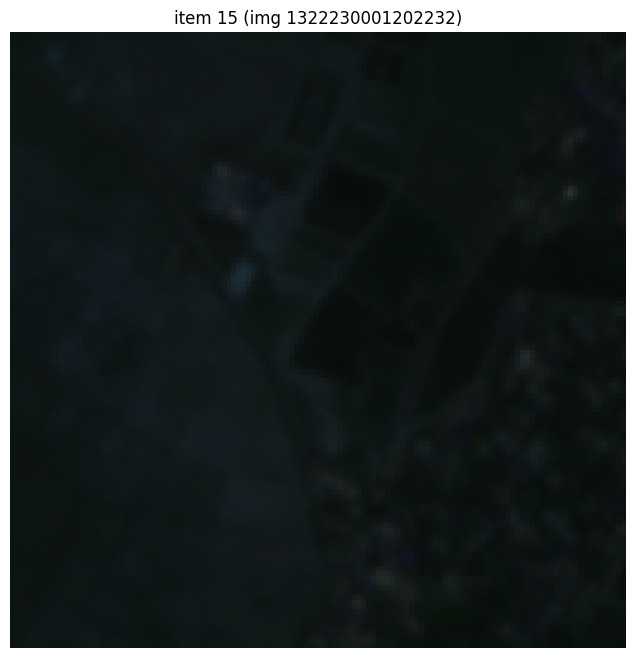

In [ ]:
pond_dataset.plot_img(idx)

##### Why Bit Depth Matters

Our chipped NICFI images are 16-bit. This is unlike the typical images we have on the internet which are 8-bit. What's the difference?

Images with higher bith depth have a greater range of colors. For 8-bit images, there are only 2^8 or 256 possible shades for red, green, and blue. For 16-bit images, there are over 2^16 or 65,536 possible values for red, green, and blue.

<img src="https://assets.videomaker.com/wp-content/uploads/drpl/articles/19251/372%20C02%20Shooting%20secondary.png" width="500">

Many other satellite images are not 8-bit.
- Sentinel-2 is 12-bit
- Sentinel-1 can be 32-bit (SLC) or 16-bit (GRD)
- Maxar's Worldview is 11-bit
- Planet's RapidEye and Airbus's Pleiades are 12-bit
- Note: NICFI actually has two versions: analytic and visual. We're using analytic with is 16-bit. The visual version is 8-bit.

Why does this matter? Most deep learning computer vision models are pretrained using the [ImageNet dataset](https://en.wikipedia.org/wiki/ImageNet). This consists of millions of images from the internet which are in 8-bit. The semantic segmentation model that we'll use here is also pretrained on ImageNet. <b> Therefore, we will need to do some additional preprocessing on the NICFI image chips so that they look closer to 8-bit images. </b>

##### Demo 2: Normalize, Clip, and Rescale Images

Instead of simply rescaling by dividing by the maximum possible value, here we have 3 preprocessing steps. Note: this is adapted from the rastervision library's [StatsTransformer](https://docs.rastervision.io/en/0.20/usage/tutorials/reading_raster_data.html#StatsTransformer)

1. Normalization (i.e. z-transform)
  - First compute the mean and standard deviation per channel, across the training set. For this tutorial these values are already precomputed for you.
  - Then compute the z-transform.
2. Clipping
  - Clip max value to 3. Any value above 3 is automatically set to 3.
  - Clip the min value to -3. Any value below -3 is automatically set to -3.
  - Benefit of clipping: controls for extreme pixel values
  - Note: -3 and 3 are thresholds that roughly correspond to 3 standard deviations from the mean, since the first step should transform the data into a [standard normal distribution](https://en.wikipedia.org/wiki/Normal_distribution). Three standard deviations from the mean capture 99.7% of the density of a standard normal distribution. The threshold can be adjusted and 3 is just a good rule of thumb.
3. Rescaling
  - Rescale the pixel values so that everything is between 0 and 1.

###### Histograms illustrating what happens step by step to a single image

Step 1: Normalization

This this step, notice that normalization makes the histogram of each channel look more consistent with roughly similar means and standard deviations.

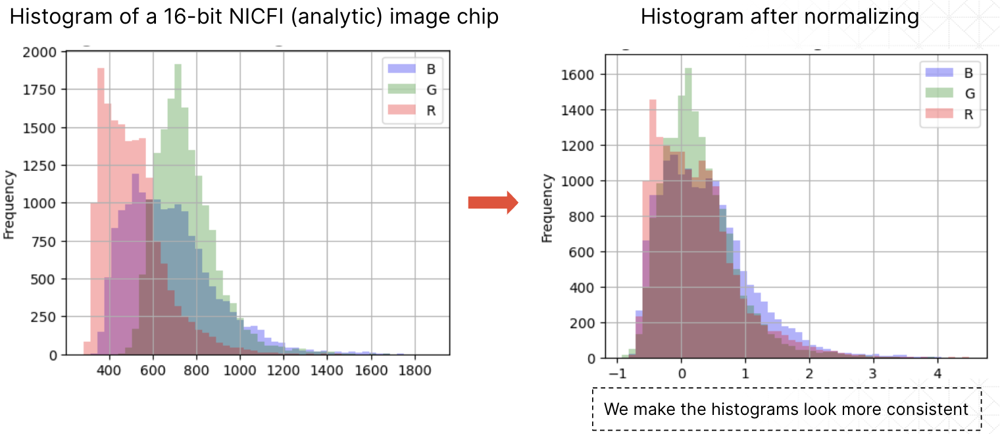

Step 2: Clipping

Clipping caps the max possible value. Notice that the clipped histogram has a bump on the max value.

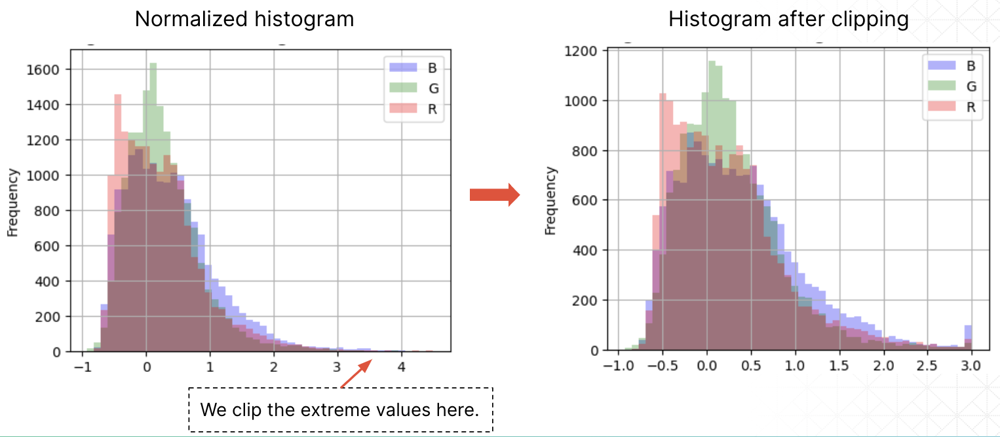

Step 3: Rescaling

With rescaling, all the histograms have values between 0 and 1, making it easier to plot the images and also use for model training.

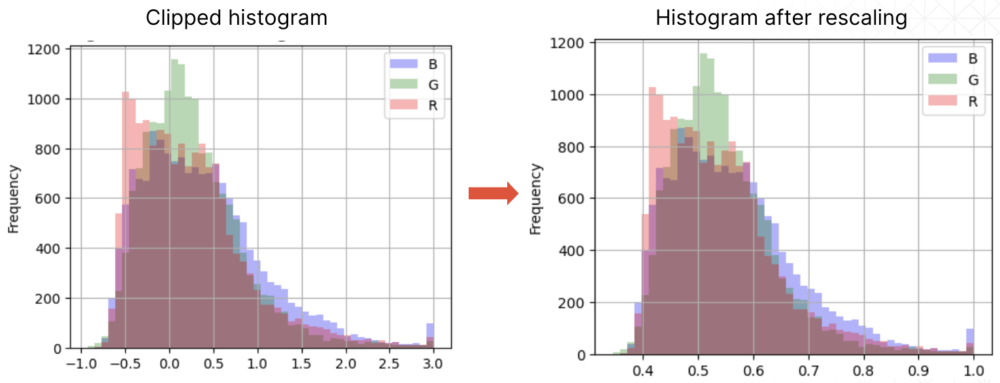

###### Demo 2 Proper

In [ ]:
pond_dataset = PondDataset(imgs_root=imgs_root, rescale_image_method = "normalize_clip_and_rescale")
pond_dataset


            Pointing to 7,112 images
            image directory: "ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles"
            

We can inspect the actual mean and standard deviations used for the normalization.

In [ ]:
pond_dataset.DATA_NORMALIZING_PARAMS

{'means': [459.06415365, 686.84029586, 568.45791792],
 'stdevs': [221.29763659, 249.20891633, 295.51260358]}

The resulting image tensor noticeable has different values. Notice the values are higher here compared to in Demo 1.

In [ ]:
pond_dataset[idx]

{'image': tensor([[[0.5308, 0.5195, 0.5218,  ..., 0.4706, 0.4661, 0.4646],
          [0.5376, 0.5158, 0.5241,  ..., 0.4796, 0.4721, 0.4894],
          [0.5406, 0.5263, 0.5165,  ..., 0.5075, 0.5097, 0.5512],
          ...,
          [0.5414, 0.5527, 0.5738,  ..., 0.4540, 0.4405, 0.4352],
          [0.5474, 0.5572, 0.5707,  ..., 0.4548, 0.4261, 0.4292],
          [0.5549, 0.5647, 0.5707,  ..., 0.4766, 0.4261, 0.4179]],
 
         [[0.5570, 0.5636, 0.5730,  ..., 0.4372, 0.4306, 0.4279],
          [0.5690, 0.5670, 0.5790,  ..., 0.4433, 0.4366, 0.4433],
          [0.5850, 0.5797, 0.5857,  ..., 0.4760, 0.4861, 0.5222],
          ...,
          [0.5857, 0.5984, 0.6158,  ..., 0.4620, 0.4627, 0.4747],
          [0.5897, 0.6024, 0.6118,  ..., 0.4586, 0.4446, 0.4633],
          [0.5944, 0.6024, 0.6205,  ..., 0.4620, 0.4299, 0.4413]],
 
         [[0.5669, 0.5539, 0.5556,  ..., 0.4524, 0.4546, 0.4620],
          [0.5612, 0.5471, 0.5454,  ..., 0.4682, 0.4558, 0.4873],
          [0.5657, 0.5488, 0.54

The image has more contrast and the aquaculture ponds are more visible.

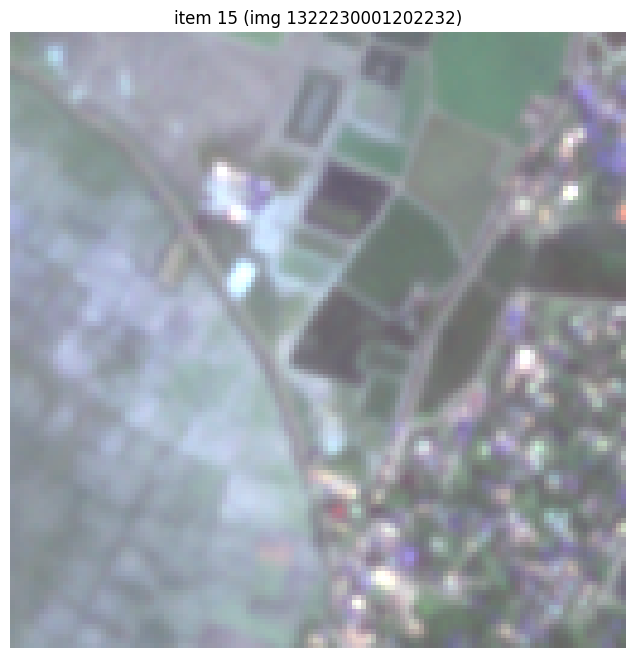

In [ ]:
pond_dataset.plot_img(idx)

##### Demo 3: Image and Mask

Now we show both the image and its corresponding mask. `PondDataset` will look for the masks in `targets_root`.

We won't explicitly define `rescale_image_method` since by default it uses `normalize_clip_and_rescale`.

In [ ]:
targets_root =  TRAINING_DATA_PATH/'annotation_masks'

In [ ]:
pond_dataset = PondDataset(imgs_root=imgs_root, targets_root=targets_root)
pond_dataset


            Pointing to 7,112 images
            image directory: "ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles"
            targets directory: "ccai2023_pond_segmentation_tutorial_data/training_data/annotation_masks"
            

When indexing, it now returns the mask as a 128 by 128 PyTorch tensor. The mask's values correspond to the class label.

In [ ]:
pond_dataset[idx]

{'image': tensor([[[0.5308, 0.5195, 0.5218,  ..., 0.4706, 0.4661, 0.4646],
          [0.5376, 0.5158, 0.5241,  ..., 0.4796, 0.4721, 0.4894],
          [0.5406, 0.5263, 0.5165,  ..., 0.5075, 0.5097, 0.5512],
          ...,
          [0.5414, 0.5527, 0.5738,  ..., 0.4540, 0.4405, 0.4352],
          [0.5474, 0.5572, 0.5707,  ..., 0.4548, 0.4261, 0.4292],
          [0.5549, 0.5647, 0.5707,  ..., 0.4766, 0.4261, 0.4179]],
 
         [[0.5570, 0.5636, 0.5730,  ..., 0.4372, 0.4306, 0.4279],
          [0.5690, 0.5670, 0.5790,  ..., 0.4433, 0.4366, 0.4433],
          [0.5850, 0.5797, 0.5857,  ..., 0.4760, 0.4861, 0.5222],
          ...,
          [0.5857, 0.5984, 0.6158,  ..., 0.4620, 0.4627, 0.4747],
          [0.5897, 0.6024, 0.6118,  ..., 0.4586, 0.4446, 0.4633],
          [0.5944, 0.6024, 0.6205,  ..., 0.4620, 0.4299, 0.4413]],
 
         [[0.5669, 0.5539, 0.5556,  ..., 0.4524, 0.4546, 0.4620],
          [0.5612, 0.5471, 0.5454,  ..., 0.4682, 0.4558, 0.4873],
          [0.5657, 0.5488, 0.54

We can inspect the class label mapping in `label_mapping`

In [ ]:
pond_dataset.label_mapping

{0: 'background', 1: 'extensive', 2: 'intensive'}

We see where the ponds are when we plot both the image and the mask.

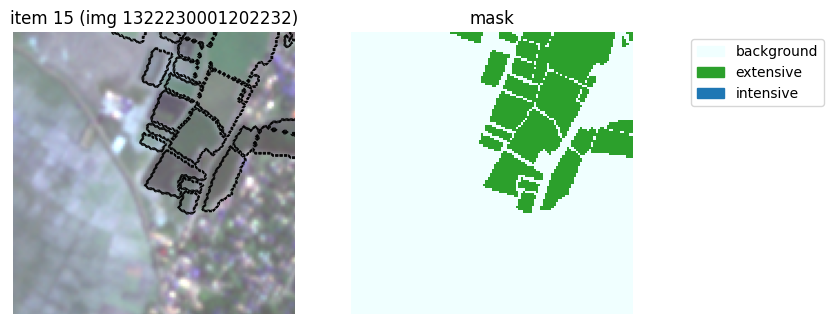

In [ ]:
pond_dataset.plot_img(idx)

##### Demo 4: Data Augmentation

[Data augmentation](https://en.wikipedia.org/wiki/Data_augmentation) is a common way to reduce overfitting by applying random (yet realistic) transformations to the training data.

Since we are working with satellite images, flips and rotations are intuitive and straightforward image transformations. We must be careful to apply the same transformation to both the image and the mask. Fortunately, the [Albumentations](https://albumentations.ai/) library makes all of this convenient for us.

The helper function `build_augmentation_transforms` uses Albumentations to return a function that can randomly apply multiple transforms at once. `PondDataset` uses this under the hood. For this tutorial, we will use the flip and rotation transforms.

In [ ]:
augmentors = ["RandomRotate90", "HorizontalFlip", "VerticalFlip"]

In [ ]:
pond_dataset = PondDataset(imgs_root=imgs_root, targets_root=targets_root, augmentors=augmentors)
pond_dataset


            Pointing to 7,112 images
            image directory: "ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles"
            targets directory: "ccai2023_pond_segmentation_tutorial_data/training_data/annotation_masks"
            

Try rerunning the next two cells multiple times. Every time you run it, there's a probability that the image will be flipped and/or rotated. This is data augmentation at work. When the PyTorch Dataset feeds the tensors to the model, there's a chance that the images are slightly modified.

In [ ]:
pond_dataset[idx]

{'image': tensor([[[0.5308, 0.5195, 0.5218,  ..., 0.4706, 0.4661, 0.4646],
          [0.5376, 0.5158, 0.5241,  ..., 0.4796, 0.4721, 0.4894],
          [0.5406, 0.5263, 0.5165,  ..., 0.5075, 0.5097, 0.5512],
          ...,
          [0.5414, 0.5527, 0.5738,  ..., 0.4540, 0.4405, 0.4352],
          [0.5474, 0.5572, 0.5707,  ..., 0.4548, 0.4261, 0.4292],
          [0.5549, 0.5647, 0.5707,  ..., 0.4766, 0.4261, 0.4179]],
 
         [[0.5570, 0.5636, 0.5730,  ..., 0.4372, 0.4306, 0.4279],
          [0.5690, 0.5670, 0.5790,  ..., 0.4433, 0.4366, 0.4433],
          [0.5850, 0.5797, 0.5857,  ..., 0.4760, 0.4861, 0.5222],
          ...,
          [0.5857, 0.5984, 0.6158,  ..., 0.4620, 0.4627, 0.4747],
          [0.5897, 0.6024, 0.6118,  ..., 0.4586, 0.4446, 0.4633],
          [0.5944, 0.6024, 0.6205,  ..., 0.4620, 0.4299, 0.4413]],
 
         [[0.5669, 0.5539, 0.5556,  ..., 0.4524, 0.4546, 0.4620],
          [0.5612, 0.5471, 0.5454,  ..., 0.4682, 0.4558, 0.4873],
          [0.5657, 0.5488, 0.54

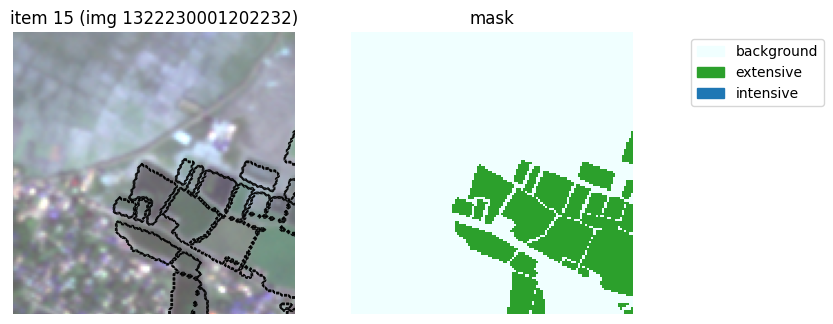

In [ ]:
pond_dataset.plot_img(idx, use_aug_transforms = True)

##### Demo 5: Plotting Multiple Images at Once

Let's try plotting 15 random images

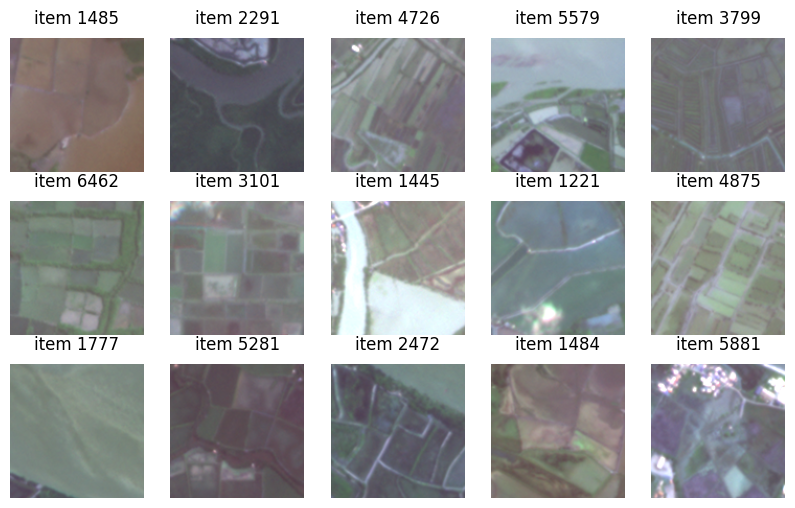

In [ ]:
idx_list = np.random.choice(range(len(pond_dataset)), size=15)
pond_dataset.plot_img_batch(idx_list)

### PyTorch Dataset Wrap Up
From the 4 demos, I hope you got an intuitive understanding of what's expected from the `PondDataset` class, and PyTorch Datasets in general! I encourage you to go back to how `PondDataset` is defined and understand how the class methods work.

TODO: use better markdown with hint

<b> Read and understand how `__init__` and `__getitem__` are defined, since this is the core of what makes a PyTorch dataset. </b> Understanding the helper functions and other class methods follow from there.
- Useful [blog post](https://sebastianraschka.com/blog/2022/datapipes.html) for understanding PyTorch datasets

Next up we'll be defining the `LightningDataModule`, a convenient way to package PyTorch `Datasets` and `DataLoaders`.

## PyTorch DataLoaders

While the PyTorch dataset returns PyTorch tensors one-by-one through indexing, the PyTorch DataLoader returns batches of PyTorch tensors. This is necessary because deep learning model training is typical usually done in batches (see [mini-batch gradient descent](https://en.wikipedia.org/wiki/Stochastic_gradient_descent)).

A DataLoader is a generator, meaning reads the data and returns the tensor on the fly. Here we sample one batch from the DataLoader.

In [ ]:
pond_dataloader = DataLoader(pond_dataset, batch_size=4, num_workers=1, shuffle=True)
sample_batch = next(iter(pond_dataloader))
sample_batch

{'image': tensor([[[[0.4066, 0.4073, 0.4209,  ..., 0.3260, 0.3252, 0.3252],
           [0.4073, 0.4073, 0.4141,  ..., 0.3245, 0.3192, 0.3139],
           [0.4171, 0.4179, 0.4043,  ..., 0.3124, 0.3222, 0.3245],
           ...,
           [0.3169, 0.3147, 0.3230,  ..., 0.3712, 0.3862, 0.3915],
           [0.3109, 0.3041, 0.3094,  ..., 0.3855, 0.3855, 0.3892],
           [0.3071, 0.3162, 0.3071,  ..., 0.3870, 0.3832, 0.3817]],
 
          [[0.3235, 0.3296, 0.3249,  ..., 0.2593, 0.2460, 0.2580],
           [0.3289, 0.3256, 0.3282,  ..., 0.2567, 0.2593, 0.2527],
           [0.3296, 0.3309, 0.3316,  ..., 0.2560, 0.2593, 0.2553],
           ...,
           [0.2433, 0.2420, 0.2426,  ..., 0.3075, 0.3095, 0.3189],
           [0.2373, 0.2353, 0.2319,  ..., 0.3008, 0.3135, 0.3249],
           [0.2346, 0.2346, 0.2326,  ..., 0.3001, 0.3142, 0.3289]],
 
          [[0.3181, 0.3114, 0.3238,  ..., 0.3238, 0.3255, 0.3255],
           [0.3210, 0.3187, 0.3221,  ..., 0.3204, 0.3232, 0.3238],
           [0.3

In [ ]:
sample_batch["image"].shape

torch.Size([4, 3, 128, 128])

## Introducing the LightningDataModule

For model training, you would have to define separate dataloaders for training and validation sets. The two sets may have different configurations. For example, you might want to turn on data augmentation for the trianing set, and turn it off for the validation set.

The `LightningDataModule` makes it convenient to define and hold multiple PyTorch DataLoaders at once. This class is expected to:
1. Set up the PyTorch dataset
  - In this tutorial it's `PondDataset`
2. Split the data into training and validation sets.
  - Here we provide a random 80-20 split between training and validation
  - There could also be a separate test set that is completely unseen by the model.
3. Provide separate dataloaders for training and validation sets.

<img src="https://www.assemblyai.com/blog/content/images/2021/12/pl_datamodule.png" height = "400">

Note: the predict dataloader is meant for loading in data for model inference, not model training.

In a nutshell, the `LightningDataModule` is the model's main reference of where to get the data from.


### Defining the LightningDataModule

Pytorch Lightning has a typical template for defining
your own LightningDataModule. We encourage you to read [its docs](https://lightning.ai/docs/pytorch/stable/data/datamodule.html).

Here we define the `PondDataModule`.
<b> It's best to dive into this class definition after understanding the `PondDataset` class.</b>

In [ ]:
class PondDataModule(LightningDataModule):
    def __init__(
        self,
        train_imgs_root: Optional[Union[str, Path]] = None,
        train_targets_root: Optional[Union[str, Path]] = None,
        predict_imgs_root: Optional[Union[str, Path]] = None,
        batch_size: int = 4,
        num_workers: int = 1,
        rescale_image_method: str = "normalize_clip_and_rescale",
        augmentors: Optional[List[str]] = None,
    ) -> None:
        """
        Args:
           train_imgs_root: Directory for the training images
           train_targets_root: Directory for the training targets
           predict_imgs_root: Directory for the prediction images
           batch_size: The batch size to use in all created DataLoaders
           num_workers: The number of workers to use in all created DataLoaders
           rescale_image_method: The preprocessing method for non-8-bit images
           augmentors: A list of transformations for data augmentation
        """

        super().__init__()

        self.train_imgs_root = train_imgs_root
        self.train_targets_root = train_targets_root
        self.predict_imgs_root = predict_imgs_root
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.rescale_image_method = rescale_image_method
        self.augmentors = augmentors

    def setup(
        self,
        stage: str,
        valid_set_pct: float = 0.2,
    ) -> None:
        """
        Create the train/val/test splits based on the original Dataset objects.
        The splits should be done here vs. in :func:`__init__` per the docs:
        https://pytorch-lightning.readthedocs.io/en/latest/extensions/datamodules.html#setup.
        """

        # stage is either 'fit', 'validate', 'test', or 'predict'

        if stage == "fit":
            if self.train_imgs_root is None or self.train_targets_root is None:
                raise ValueError(
                    "Can't train a model if train_imgs_root is None or train_targets_root is None. Specify the dirs of the training data."
                )

            dataset = PondDataset(
                imgs_root=self.train_imgs_root,
                targets_root=self.train_targets_root,
                rescale_image_method=self.rescale_image_method,
                augmentors=self.augmentors,
            )

            train_val_split = ShuffleSplit(
                test_size=valid_set_pct,
                n_splits=1,
            )
            train_indices, val_indices = next(train_val_split.split(dataset.data_ids))

            self.train_dataset = Subset(dataset, train_indices, use_aug_transforms=True)
            self.val_dataset = Subset(dataset, val_indices, use_aug_transforms=False)

        if stage == "predict":
            if self.predict_imgs_root is None:
                raise ValueError(
                    "Can't train a model if pred_imgs_root is None. Specify the dir of the inference data."
                )

            pred_mask_fname_suffix = "-pred_mask.tif"
            self.predict_dataset = PondDataset(
                imgs_root=self.predict_imgs_root,
                targets_root=None,
                mask_fname_suffix=pred_mask_fname_suffix,
                rescale_image_method=self.rescale_image_method,
                augmentors=None,
            )

    def train_dataloader(self) -> DataLoader:
        """Return a DataLoader for training.
        Returns:
            training data loader
        """
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            shuffle=True,
        )

    def val_dataloader(self) -> DataLoader:
        """Return a DataLoader for validation.
        Returns:
            validation data loader
        """
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            shuffle=False,
        )

    def predict_dataloader(self) -> DataLoader:
        """Return a DataLoader for prediction.
        Returns:
            prediction data loader
        """
        return DataLoader(
            self.predict_dataset,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            shuffle=False,
        )


In [ ]:
DATAMODULE_KWARGS = {
    "train_imgs_root":imgs_root,
    "train_targets_root":targets_root,
    "augmentors":augmentors,
    # also specify the batch size and the number of CPU workers
    "batch_size":128,
    "num_workers":2,
}
DATAMODULE_KWARGS

{'train_imgs_root': PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/model_tiles'),
 'train_targets_root': PosixPath('ccai2023_pond_segmentation_tutorial_data/training_data/annotation_masks'),
 'augmentors': ['RandomRotate90', 'HorizontalFlip', 'VerticalFlip'],
 'batch_size': 128,
 'num_workers': 2}

In [ ]:
pond_datamodule = PondDataModule(**DATAMODULE_KWARGS)

Now we're ready to move on to the model!

# Setting up the Model

We'll be using two main dependencies for the semantic segmentation model.

1. [segmentation_models_pytorch](https://github.com/qubvel/segmentation_models.pytorch)
  - It hosts pretrained semantic segmentation models which are predefined [torch.nn.Module](https://pytorch.org/docs/stable/generated/torch.nn.Module.html) classes
  - We will finetune this for the pond dataset
2. PyTorch Lightning's [LightningModule](https://lightning.ai/docs/pytorch/stable/common/lightning_module.html)
  - Encapsulates all model core logic, with the `torch.nn.Module` sitting at the center

### The U-Net

The U-Net is the most commonly used architecture for semantic segmentation.

U-Net's architecture is reminiscent of a U-shape, which comprises a contracting path (encoder) and an expansive path (decoder). The encoder captures context while the decoder allows for precise localization. This is essential for distinguishing between closely located or adjacent features in satellite imagery

The most significant and important part of U-Net is the skip connections which copy the outputs of each stage within the encoder to the corresponding stages in the decoder. This design propagates essential high-resolution contextual information along the network, which encourages the network to re-use the low-level representation along with the high-context representation for accurate localization. [(Azad et al., 2022)](https://arxiv.org/abs/2211.14830)

<img src = "https://miro.medium.com/v2/resize:fit:1400/format:webp/1*f7YOaE4TWubwaFF7Z1fzNw.png" height = "350">

The encoder is also sometimes called the model backbone. We can use pretrained backbone such as ResNet-50 so that we can achieve better model performance instead of training a U-Net model entirely from scratch.

During model training, the encoder will be finetuned starting from the pretrained weights, while the decoder will be trained from scratch.

Let's try getting a pretrained U-Net model from `segmentation_models_pytorch`. Notice that the library downloads a pretrained ResNet-50 backbone for us.

In [ ]:
import segmentation_models_pytorch as smp

model = smp.create_model(arch="unet", encoder_name="resnet50")

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 93.5MB/s]


The `model` is actually a `torch.nn.Module`. The most important features that'll you'll use are
1. The `forward` method for the neural net's forward pass
  - For simplicity, you can call the module itself to perform a forward pass such as `model(X)` where `X` is a Pytorch tensor.
2. Accessing the weights and biases of the neural net via the `parameters` attribute. This is essential when you want to pass these parameters to optimizers during model training.

In [ ]:
isinstance(model, torch.nn.Module)

True

In [ ]:
# sample of a forward pass using a batch of images
model(sample_batch["image"])

tensor([[[[ 1.2800e-01, -1.1976e-01, -1.1515e-01,  ...,  4.1140e-01,
            4.1685e-01,  3.4755e-01],
          [-1.9863e-01, -6.2936e-01, -9.3827e-01,  ...,  1.1440e-02,
           -4.5674e-01, -1.7873e-01],
          [-5.1122e-01, -9.0313e-01, -1.2084e+00,  ..., -8.0771e-01,
           -6.5180e-01, -3.1487e-01],
          ...,
          [-2.9372e-01, -6.3198e-01, -1.1078e+00,  ...,  5.0479e-01,
           -8.7990e-01, -9.5694e-01],
          [-2.3917e-01, -7.8953e-01, -1.1323e+00,  ..., -8.2632e-01,
           -1.7852e+00, -9.2177e-01],
          [-5.4037e-01, -8.0743e-01, -9.3106e-01,  ..., -9.5556e-01,
           -1.4639e+00, -9.0739e-01]]],


        [[[-5.5605e-02,  2.4808e-01,  4.0133e-04,  ...,  1.3949e-01,
            1.9683e-01,  4.1679e-01],
          [ 2.2919e-04, -3.3671e-01, -7.4623e-01,  ..., -9.5468e-01,
           -6.7889e-01,  2.5540e-01],
          [-4.2185e-01, -8.6985e-01, -1.0262e+00,  ..., -1.0876e+00,
           -8.4294e-01, -1.1249e-01],
          ...,
   

### Defining the LightningModule

A `LightningModule` encapsulates all of the model's core logic. It's mainly responsible for:

1. Defining the neural network architecture
2. Specifying the forward pass
3. Specifying the optimization logic (losses, optimizers, learning rate schedulers)
4. Defining training, validation, test step, and prediction behavior (evaluation metrics)
5. Model specific preprocessing steps (e.g. normalization with respect to imagenet parameters)

We encourage you to read the docs [here](https://lightning.ai/docs/pytorch/stable/common/lightning_module.html)

Below we define the `SegmentationModel` class from the base `LightningModule`.

In [ ]:
import warnings
from typing import Any, Dict, Optional, Tuple

import segmentation_models_pytorch as smp
import torch
import torch.nn as nn
from lightning import LightningModule
from segmentation_models_pytorch.encoders import get_preprocessing_params
from torch import Tensor
from torch.optim import Optimizer
from torchmetrics import (
    Accuracy,
    Dice,
    F1Score,
    JaccardIndex,
    MatthewsCorrCoef,
    MetricCollection,
    Precision,
    Recall,
)

class SegmentationModel(LightningModule):
    """LightningModule for semantic segmentation of images."""

    def __init__(
        self,
        segmentation_model: str,
        encoder_name: str,
        encoder_weights: Optional[str],
        num_classes: int,
        in_channels: int,
        loss: str = "dice",
        learning_rate: float = 1e-4,
        **kwargs,
    ) -> None:
        """Initialize the LightningModule with a model and loss function.

        Keyword Args:
            segmentation_model: Name of the segmentation model type to use
            encoder_name: Name of the encoder model backbone to use
            encoder_weights: None or "imagenet" to use imagenet pretrained weights in
                the encoder model
            num_classes: Number of semantic classes to predict
            in_channels: Number of channels in input image
            loss: Name of the loss function
            learning_rate: self-explanatory
        Raises:
            ValueError: if kwargs arguments are invalid
        """
        super().__init__()

        # Creates `self.hparams` from kwargs
        self.save_hyperparameters()

        self._config_preprocessing()
        self._config_model()
        self._config_loss()
        self._config_metrics()

    def _config_preprocessing(self) -> None:
        """
        Configures the normalization based on the statistics of the images the pretrained neural net was trained on
        """
        _params = get_preprocessing_params(
            encoder_name=self.hparams["encoder_name"],
            pretrained=self.hparams["encoder_weights"],
        )
        assert _params["input_space"] == "RGB"
        assert _params["input_range"] == [0, 1]

        self.nn_normalize = build_normalizing_transform(
            means=_params["mean"], stdevs=_params["std"]
        )

    def _config_model(self) -> None:
        """
        Configures the model itself
        """

        self.model = smp.create_model(
            arch=self.hparams["segmentation_model"],
            encoder_name=self.hparams["encoder_name"],
            encoder_weights=self.hparams["encoder_weights"],
            in_channels=self.hparams["in_channels"],
            classes=self.hparams["num_classes"],
        )

    def _config_loss(self) -> None:
        """Configures the loss based on kwargs parameters passed to the constructor."""

        if self.hparams["loss"] == "ce":
            self.loss = nn.CrossEntropyLoss()
        elif self.hparams["loss"] == "jaccard":
            self.loss = smp.losses.JaccardLoss(mode="multiclass")
        elif self.hparams["loss"] == "focal":
            self.loss = smp.losses.FocalLoss(
                mode="multiclass",
                normalized=True,
            )
        elif self.hparams["loss"] == "dice":
            self.loss = smp.losses.DiceLoss(
                mode="multiclass",
            )
        elif self.hparams["loss"] == "tversky":
            self.loss = smp.losses.TverskyLoss(
                mode="multiclass",
            )
        else:
            raise ValueError(f"Loss type '{self.hparams['loss']}' is not supported.")

    def _config_metrics(self) -> None:
        TASK = "multiclass"

        metrics_dict = {
            "Accuracy": Accuracy(
                task=TASK,
                num_classes=self.hparams["num_classes"],
                average="micro",
                multidim_average="global",
            ),
            "Precision": Precision(
                task=TASK,
                num_classes=self.hparams["num_classes"],
                multidim_average="global",
                average="micro",
            ),
            "Recall": Recall(
                task=TASK,
                num_classes=self.hparams["num_classes"],
                multidim_average="global",
                average="micro",
            ),
            "F1Score": F1Score(
                task=TASK,
                num_classes=self.hparams["num_classes"],
                multidim_average="global",
                average="micro",
            ),
            "MatthewsCorrCoef": MatthewsCorrCoef(
                task=TASK,
                num_classes=self.hparams["num_classes"],
            ),
        }
        self.val_metrics = MetricCollection(metrics_dict, prefix="val_")

    def forward(self, images: Tensor) -> Tensor:
        images = self.nn_normalize(images)

        output = self.model(images)

        return output

    def _shared_eval_step(
        self, batch: Dict[str, Tensor], batch_idx: int
    ) -> Dict[str, Tensor]:
        images = batch["image"]
        masks = batch["mask"]
        pred_mask_logits = self.forward(images)
        pred_masks = pred_mask_logits.argmax(dim=1)

        loss = self.loss(pred_mask_logits, masks)

        eval_outputs = {
            "pred_mask": pred_masks,
            "loss": loss,
        }

        return eval_outputs

    def training_step(
        self,
        batch: Dict[str, Tensor],
        batch_idx: int,
    ) -> Tensor:
        """Compute and return the training loss.

        Args:
            batch: the output of your DataLoader
            batch_idx: the index of this batch
        Returns:
            training loss
        """

        eval_outputs = self._shared_eval_step(batch, batch_idx)
        loss = eval_outputs["loss"]
        pred_masks = eval_outputs["pred_mask"]
        masks = batch["mask"]

        self.log("train_loss", loss, on_step=False, on_epoch=True)

        return loss

    def validation_step(
        self,
        batch: Dict[str, Tensor],
        batch_idx: int,
    ) -> None:
        """Compute validation loss/metrics and log example predictions.

        Args:
            batch: the output of your DataLoader
            batch_idx: the index of this batch
        """

        eval_outputs = self._shared_eval_step(batch, batch_idx)
        loss = eval_outputs["loss"]
        pred_masks = eval_outputs["pred_mask"]
        masks = batch["mask"]

        self.log("val_loss", loss, on_step=False, on_epoch=True)
        self.val_metrics.update(pred_masks, masks)

    def on_validation_epoch_end(self) -> None:
        """Logs epoch level validation metrics."""
        epoch_metrics = self.val_metrics.compute()
        self.log_dict(epoch_metrics)
        self.val_metrics.reset()

    def predict_step(
        self,
        batch: Dict[str, Tensor],
        batch_idx: int,
    ) -> Tuple[Tensor, Tensor]:
        """Performs model inference

        Args:
           batch: the output of your DataLoader
           batch_idx: the index of this batch
        """

        images = batch["image"]
        image_indices = batch["image_idx"]
        pred_masks = self.forward(images)
        pred_masks = pred_masks.argmax(dim=1)

        return image_indices, pred_masks

    def configure_optimizers(self) -> Dict[str, Any]:
        """Initialize the optimizer and learning rate scheduler.

        Returns:
            a "lr dict" according to the pytorch lightning documentation --
            https://lightning.ai/docs/pytorch/latest/common/lightning_module.html#configure-optimizers
        """
        optimizer = torch.optim.Adam(
            self.model.parameters(), lr=self.hparams["learning_rate"]
        )
        optimizer_config = {"optimizer": optimizer}

        return optimizer_config

### Using the Dice Loss

Here we use the [Dice loss](https://paperswithcode.com/method/dice-loss) as our main loss function. It measures the overlap between the predicted segmentation mask and the ground truth.The Dice loss is particularly useful when the dataset classes are imbalanced, which is applicable in our case.

In contrast, the cross-entropy loss, another popular loss function for classification tasks is more biased towards the majority class since it treats each pixel independently. The large number of negative samples (often background pixels in segmentation tasks) can overshadow the contribution of positive samples (often the object of interest).

The dice loss is available in `segmentation_models_pytorch` library, and we used it in `SegmentationModel`


### Initializing the LightningModule

In [ ]:
LIGHTNINGMODULE_KWARGS = {
 'segmentation_model': 'unet',
 'encoder_name': 'resnet50',
 'encoder_weights': 'imagenet',
 'loss': 'dice',
 'learning_rate': 0.0001,
 'in_channels': pond_dataset.NUM_IN_CHANNELS,
 'num_classes': pond_dataset.NUM_CLASSES,
}
LIGHTNINGMODULE_KWARGS

{'segmentation_model': 'unet',
 'encoder_name': 'resnet50',
 'encoder_weights': 'imagenet',
 'loss': 'dice',
 'learning_rate': 0.0001,
 'in_channels': 3,
 'num_classes': 3}

In [ ]:
model = SegmentationModel(**LIGHTNINGMODULE_KWARGS)

When you pass a PyTorch tensor to `SegmentationModel`, it will perform a forward pass of the defined model within, which is a U-Net model. This shows how `SegmentationModel` can

In [ ]:
model(sample_batch["image"])

tensor([[[[-1.4607, -0.0540, -0.4748,  ..., -0.5833, -0.1278,  0.2084],
          [-0.0818,  1.4097,  0.5598,  ...,  0.1178, -0.4172,  0.2841],
          [ 0.1745,  1.8178,  1.6937,  ..., -1.1045, -0.9806, -0.3095],
          ...,
          [-0.1796,  1.1614,  0.8462,  ..., -0.1397,  0.6199,  0.5666],
          [-0.0736,  0.8082, -0.3255,  ...,  0.1398,  0.1508,  0.2430],
          [ 0.2362,  0.8440,  0.0072,  ...,  0.9107,  0.6401,  0.3447]],

         [[-0.7129,  0.0390, -0.0035,  ..., -0.5604, -0.1621, -0.4754],
          [-1.2969, -0.8814, -0.2691,  ...,  0.5751,  0.7779,  0.4411],
          [-0.3781, -0.3395,  0.5574,  ..., -0.9374,  0.2759,  0.9027],
          ...,
          [-0.1521, -0.0173, -1.0200,  ..., -0.5144,  0.3700,  0.0104],
          [-0.1957, -0.0361, -0.3509,  ...,  0.2622,  0.5084, -0.1543],
          [-0.0223,  0.0109, -0.2510,  ...,  0.0463,  0.0338, -0.1403]],

         [[-0.2840,  0.1526,  0.9082,  ...,  0.0217,  0.2632,  0.1574],
          [ 0.2372,  1.5160,  

# Setting up the Trainer

To recap what we've set up so far
- `LightningDataModule`: encapsulates data logic
- `LightningModule`: encapsulates model logic

Now we define the Pytorch Lightning `Trainer` that encapsulates training loop automation logic.

While the `LightningModule` is responsible for defining the "what" of the model, the `Trainer` is resonsible for managing the "how" of model training. More specifically, the `Trainer` handles
- Automating the training and validation loops
- Easy switching between CPU, GPU, and TPU via the `accelerator` argument
- Checkpointing to save our model
- Logging to track training loss and validation

For more learning, refer to the [docs](https://lightning.ai/docs/pytorch/stable/common/trainer.html)


In [ ]:
# make a folder to save the model and logs
MODELS_PATH = Path("models")
MODELS_PATH.mkdir(exist_ok = True)

In [ ]:
from lightning.pytorch.loggers import CSVLogger

# this logger takes care of saving metrics per epoch to a csv
csv_logger = CSVLogger(save_dir=MODELS_PATH)
csv_logger

In [ ]:
from lightning.pytorch.callbacks import ModelCheckpoint

monitor_metric = "val_F1Score"
filename = "{epoch}-{val_loss:.2f}-{" + monitor_metric + ":.2f}"

# the model checkpoint takes care of saving the model every epoch
# after all epochs are done, the model with the maximum validation dice score is saved as the final model
model_checkpoint = ModelCheckpoint(
    monitor=monitor_metric,
    mode="max",
    filename=filename,
    auto_insert_metric_name=True,
)

In [ ]:
TRAINER_KWARGS = {'accelerator': 'auto',
 'devices': 1,
 'max_epochs': 5,
 'logger': [csv_logger],
 'default_root_dir': MODELS_PATH,
 'callbacks': [model_checkpoint],
}

TRAINER_KWARGS

{'accelerator': 'auto',
 'devices': 1,
 'max_epochs': 5,
 'logger': [<lightning.pytorch.loggers.csv_logs.CSVLogger at 0x7af24b4a3c40>],
 'default_root_dir': PosixPath('models'),
 'callbacks': [<lightning.pytorch.callbacks.model_checkpoint.ModelCheckpoint at 0x7af24b4a3dc0>]}

In [ ]:
from lightning import Trainer

trainer = Trainer(**TRAINER_KWARGS)
trainer

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


# Training the model

Now that we have set up the `LightningDataModule`, the `LightningModule`, and the `Trainer`, we're ready to train the model!

As specified in the `Trainer`, we'll be training the model for only 5 epochs. However feel free to train for more epochs and see if you can get a better model. With the model checkpoint set up, it will save from the best epoch at the end of the training.

In [ ]:
## we set a random seed for reproducibility
from lightning import seed_everything
seed_everything(seed = 1001)

INFO: Seed set to 1001
INFO:lightning.fabric.utilities.seed:Seed set to 1001


1001

In [ ]:
%%time
trainer.fit(model=model, datamodule=pond_datamodule)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name         | Type             | Params
--------------------------------------------------
0 | nn_normalize | Normalize        | 0     
1 | model        | Unet             | 32.5 M
2 | loss         | DiceLoss         | 0     
3 | val_metrics  | MetricCollection | 0     
--------------------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.086   Total estimated model params size (MB)
INFO:lightning.pytorch.callbacks.model_summary:
  | Name         | Type             | Params
--------------------------------------------------
0 | nn_normalize | Normalize        | 0     
1 | model        | Unet             | 32.5 M
2 | loss         | DiceLoss         | 0     
3 | val_metrics  | MetricCollection | 0     
--------------------------------------------------
32.5 M    Trainable params
0  

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loops/fit_loop.py:293: The number of training batches (45) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=5` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.


CPU times: user 1min 9s, sys: 8.51 s, total: 1min 17s
Wall time: 7min 27s


## Evaluating performance on the validation set

We check how the saved model performs against the validation set. You should expect to see an F1 Score of around 70%. This should be a decent result.

In [ ]:
trainer.validate(model=model, datamodule=pond_datamodule, ckpt_path="best")

INFO: Restoring states from the checkpoint path at models/lightning_logs/version_0/checkpoints/epoch=3-val_loss=0.51-val_F1Score=0.72.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at models/lightning_logs/version_0/checkpoints/epoch=3-val_loss=0.51-val_F1Score=0.72.ckpt
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Loaded model weights from the checkpoint at models/lightning_logs/version_0/checkpoints/epoch=3-val_loss=0.51-val_F1Score=0.72.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Loaded model weights from the checkpoint at models/lightning_logs/version_0/checkpoints/epoch=3-val_loss=0.51-val_F1Score=0.72.ckpt


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       val_Accuracy        │    0.7227576375007629     │
│        val_F1Score        │    0.7227576375007629     │
│   val_MatthewsCorrCoef    │    0.33369508385658264    │
│       val_Precision       │    0.7227576375007629     │
│        val_Recall         │    0.7227576375007629     │
│         val_loss          │    0.5115302205085754     │
└───────────────────────────┴───────────────────────────┘

[{'val_loss': 0.5115302205085754,
  'val_Accuracy': 0.7227576375007629,
  'val_F1Score': 0.7227576375007629,
  'val_MatthewsCorrCoef': 0.33369508385658264,
  'val_Precision': 0.7227576375007629,
  'val_Recall': 0.7227576375007629}]

### Model Discussion and Areas for Future Work

Since we used a semantic segmentation model, the model does not distinguish between adjacent ponds of the same class, especially if the boundaries between ponds are relatively thin. This results in having “blobs” of ponds, which can be seen in the visualization section later.

This also illustrates one of the sources of model error, as the gaps between ponds that should be classified as background are classified as one of the pond classes. It was not necessary to delineate boundaries between the ponds for the Climate Smart Shrimp use case, but future work can develop an instance segmentation model to delineate individual ponds.

We see several opportunities for future work to build on and improve our current contributions that we summarize below:
1. The U-Net model is only built for semantic segmentation, which does not explicitly delineate individual ponds. Model experimentation on instance segmentation or panoptic segmentation models may result in better delineated ponds that can also help in estimating yield similar to Ottinger, Clauss, and Kuenzer (2018).
2. A similar approach can be applied to produce aquaculture classifications in other countries in Southeast Asia, where mangrove deforestation due to aquaculture farming remains to be a problem.
3. Researchers can explore time series of satellite images, for monitoring the number of intensive ponds over time.



## Inspecting the model artifacts
Let's take some time to check the model artifacts saved in `models/lightning_logs` after model training

In [ ]:
os.listdir("models/lightning_logs/version_0")

`hparams` saves the kwargs of the LightningModule

In [ ]:
import yaml

with open("models/lightning_logs/version_0/hparams.yaml", 'r') as file:
    hparams = yaml.safe_load(file)

hparams

{'encoder_name': 'resnet50',
 'encoder_weights': 'imagenet',
 'in_channels': 3,
 'learning_rate': 0.0001,
 'loss': 'dice',
 'num_classes': 3,
 'segmentation_model': 'unet'}

The checkpoints folder contains snapshot of the model at the end of a certain epoch

In [ ]:
checkpt_fname = os.listdir("models/lightning_logs/version_0/checkpoints")[0]
checkpt_fname

'epoch=3-val_loss=0.51-val_F1Score=0.72.ckpt'

## Visualizing the model metrics
We can visualize how the model improves over the epochs by inspecting the saved file from the CSV logger.

The CSV logger logs a separate row for the training step and the validation step. So let's clean it up a bit before visualizing.

In [ ]:
model_metrics_path = "models/lightning_logs/version_0/metrics.csv"
model_metrics = pd.read_csv(model_metrics_path)
model_metrics

,val_MatthewsCorrCoef,val_F1Score,val_Recall,val_loss,val_Accuracy,step,val_Precision,epoch,train_loss
0,0.367936,0.664757,0.664757,0.584304,0.664757,44,0.664757,0,NaN
1,NaN,NaN,NaN,NaN,NaN,44,NaN,0,0.646306
2,0.409401,0.697345,0.697345,0.546667,0.697345,89,0.697345,1,NaN
3,NaN,NaN,NaN,NaN,NaN,89,NaN,1,0.553678
4,0.419236,0.715084,0.715084,0.508982,0.715084,134,0.715084,2,NaN
5,NaN,NaN,NaN,NaN,NaN,134,NaN,2,0.504119
6,0.333695,0.722758,0.722758,0.511530,0.722758,179,0.722758,3,NaN
7,NaN,NaN,NaN,NaN,NaN,179,NaN,3,0.460771
8,0.421640,0.718493,0.718493,0.460818,0.718493,224,0.718493,4,NaN
9,NaN,NaN,NaN,NaN,NaN,224,NaN,4,0.422475


In [ ]:
bool_mask = model_metrics["train_loss"].isnull()
usecols = ["epoch","train_loss"]
train_metrics = model_metrics.loc[~bool_mask,usecols].copy()

bool_mask = model_metrics["val_loss"].isnull()
usecols = ["epoch"] + [col for col in model_metrics.columns if col.startswith("val_")]
val_metrics = model_metrics.loc[~bool_mask,usecols].copy()

model_metrics = pd.merge(train_metrics, val_metrics, on = "epoch", validate = "one_to_one")
model_metrics

,epoch,train_loss,val_MatthewsCorrCoef,val_F1Score,val_Recall,val_loss,val_Accuracy,val_Precision
0,0,0.646306,0.367936,0.664757,0.664757,0.584304,0.664757,0.664757
1,1,0.553678,0.409401,0.697345,0.697345,0.546667,0.697345,0.697345
2,2,0.504119,0.419236,0.715084,0.715084,0.508982,0.715084,0.715084
3,3,0.460771,0.333695,0.722758,0.722758,0.511530,0.722758,0.722758
4,4,0.422475,0.421640,0.718493,0.718493,0.460818,0.718493,0.718493


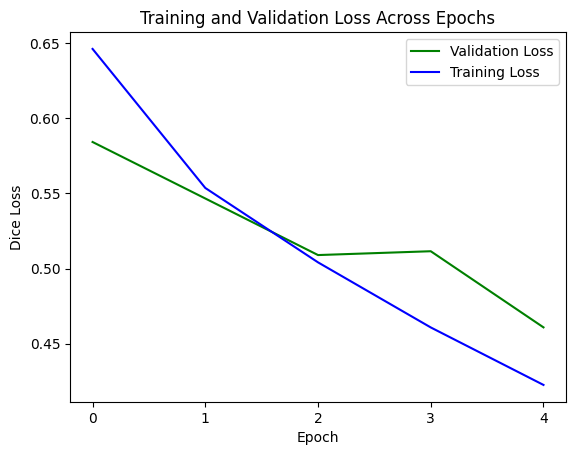

In [ ]:
import matplotlib

fig, ax = plt.subplots()
ax.plot(model_metrics["epoch"], model_metrics["val_loss"], color = "green", label = "Validation Loss")
ax.plot(model_metrics["epoch"], model_metrics["train_loss"], color = "blue", label = "Training Loss")
ax.xaxis.set_major_locator(matplotlib.ticker.MaxNLocator(integer=True))
ax.legend()
ax.set_xlabel("Epoch")
ax.set_ylabel("Dice Loss")
ax.set_title("Training and Validation Loss Across Epochs")
plt.show()

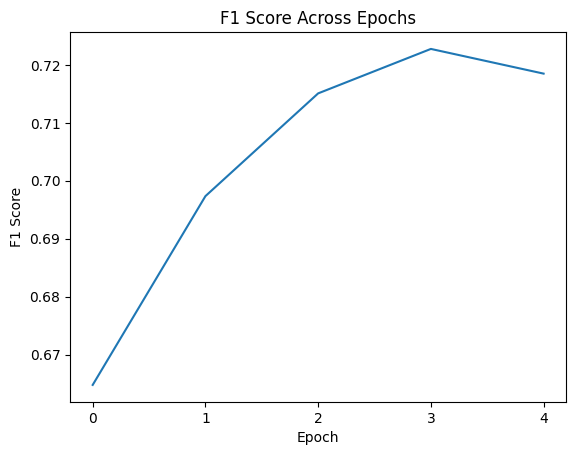

In [ ]:
fig, ax = plt.subplots()
ax.plot(model_metrics["epoch"], model_metrics["val_F1Score"])
ax.xaxis.set_major_locator(matplotlib.ticker.MaxNLocator(integer=True))
ax.set_xlabel("Epoch")
ax.set_ylabel("F1 Score")
ax.set_title("F1 Score Across Epochs")
plt.show()

You might also want to check out [Weights and Biases](https://wandb.ai/site) (or WandB) to visualize your model training metrics. PyTorch Lightning has a [logger specific to WandB](https://lightning.ai/docs/pytorch/stable/api/lightning.pytorch.loggers.wandb.html)

# Rolling out the Model


### Setting up the before model inference

Now that we have a trained model, we can predict on images the model hasn't seen before. We can reuse much of the logic we've defined earlier and simply reinitialize the relevant classes.

1. Reinitialize the `PondDataModule` to point to the image directory for model rollout, not the image directory for model training.
2. Reinitialize the `SegmentationModel` by loading from a model checkpoint.
3. Reinitialize the `Trainer` such that it turns logging off and it uses a callback to write predictions per batch.


For model rollout, we also have chipped NICFI images across the Philippinesa. The images are from aquaculture areas within 3km from the coastline.

In [ ]:
predict_imgs_root = ROLLOUT_DATA_PATH/'model_tiles'

In [ ]:
DATAMODULE_KWARGS = {
    "predict_imgs_root":predict_imgs_root,
    # also specify the batch size and the number of CPU workers
    "batch_size":128,
    "num_workers":2,
}
DATAMODULE_KWARGS

{'predict_imgs_root': PosixPath('ccai2023_pond_segmentation_tutorial_data/rollout_data/model_tiles'),
 'batch_size': 128,
 'num_workers': 2}

In [ ]:
pond_datamodule = PondDataModule(**DATAMODULE_KWARGS)

We load the best checkpoint from model training earlier

In [ ]:
checkpt_path = f"models/lightning_logs/version_0/checkpoints/{checkpt_fname}"
model = SegmentationModel.load_from_checkpoint(checkpt_path)


During model training, recall that we used the `ModelCheckpoint` callback to save the best model based on a given metric.

Now we'll define our own callback, the `SemanticSegmentationPredictionWriter`, so we can write each batch predictions to disk. This way, we don't have to accumulate all predictions on memory before writing to disk, where we run the risk of running out of memory.

The callback is a decoupled way of adding non-essential logic to the `LightningModule` via predefined "hooks". For more information on the callback system, read the [docs here](https://lightning.ai/docs/pytorch/stable/extensions/callbacks.html).

In [ ]:
from typing import Any, Dict, Optional, Sequence, Tuple, Union
from pathlib import Path
from torch import Tensor
from lightning import Trainer, LightningModule

from lightning.pytorch.callbacks import BasePredictionWriter

class SemanticSegmentationPredictionWriter(BasePredictionWriter):
    def __init__(
        self,
        output_dir: Union[str, Path],
    ):
        WRITE_INTERVAL = "batch"
        super().__init__(WRITE_INTERVAL)
        self.output_dir = Path(output_dir)

    def write_on_batch_end(
        self,
        trainer: Trainer,
        pl_module: LightningModule,
        prediction: Tuple[Tensor, Dict[str, Tensor]],
        batch_indices: Optional[Sequence[int]],
        batch: Any,
        batch_idx: int,
        dataloader_idx: int,
    ):
        idx_batch, pred_targets_batch = prediction
        idx_batch = idx_batch.cpu().numpy()

        # save predictions to disk
        for idx, pred_targets in zip(idx_batch, pred_targets_batch):
            trainer.datamodule.predict_dataset.save_predictions(
                idx=idx,
                pred_mask=pred_targets,
                output_dir=self.output_dir,
            )

In [ ]:
predict_targets_root = Path("prediction_masks")
predict_targets_root.mkdir(exist_ok=True)

TRAINER_KWARGS = {
    "accelerator": "auto",
    "logger": False,
    "callbacks": [SemanticSegmentationPredictionWriter(output_dir=predict_targets_root)],
}

In [ ]:
trainer = Trainer(**TRAINER_KWARGS)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


### Running model inference
With the 3 main components set up, we start predicting!

In [ ]:
%%time
trainer.predict(model=model, datamodule=pond_datamodule, return_predictions=False)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

CPU times: user 1min 37s, sys: 20.3 s, total: 1min 58s
Wall time: 3min 11s


## Visualizing the results

Let's reuse the `PondDataset` class to visualize the image chip versus the predicted mask

In [ ]:
predictions_dataset = PondDataset(imgs_root=predict_imgs_root,
                                  targets_root=predict_targets_root,
                                  mask_fname_suffix = "-pred_mask.tif")

In [ ]:
idx = 1552
predictions_dataset.plot_img(idx)

## Mask Polygonization

Its their current state, the predicted masks are in raster format which are rather cumbersome to use for further geospatial analysis and visualization. For this dataset, a vector format would be more convenient.

The last key step is converting the predictions from raster to vector. This step is called polygonization, the reverse of rasterization.

![polygonization](https://desktop.arcgis.com/en/arcmap/latest/extensions/arcglobe/GUID-0E3D651A-34B6-44D2-AE29-B527B86547A1-web.gif)


In [ ]:
pred_mask_fpaths = os.listdir(predict_targets_root)
pred_mask_fpaths = [predict_targets_root/fname for fname in pred_mask_fpaths]
len(pred_mask_fpaths), pred_mask_fpaths[:3]

#### Utility functions for polygonization

Apart from the polygonization step itself, the utility functions below handle these other postprocessing tasks
1. Excluding background pixels during polygonization
2. Optionally simplify the tolerance
3. Fix geometry errors if any (e.g. self intersecting polygons)
4. Adding a unique id (uid) per polygon
5. Merging polygons across different images

In [ ]:
from pathlib import Path
from typing import Any, Iterator, List, Optional, Union

import geopandas as gpd
import pandas as pd
import rasterio as rio
from geowrangler.validation import GeometryValidation
import geowrangler.tile_clustering as tile_clustering
from loguru import logger
from pyproj import CRS
from rasterio import features
from shapely.geometry import shape
from tqdm import tqdm
from functools import reduce


def polygonize_raster_mask(
    raster_mask_fpath: Union[str, Path],
    skip_labels: List[int],
    simplify_tolerance_m: Optional[float] = None,
    output_crs: str = "epsg:4326",
) -> gpd.GeoDataFrame:
    """
    Creates a polygon per label in the raster mask
    """

    raster_mask_fpath = Path(raster_mask_fpath)
    with rio.open(raster_mask_fpath) as src:
        raster_mask = src.read(indexes=1)
        raster_meta = src.meta
        raster_transform = src.transform

    # Generate a boolean mask for skipped labels (e.g. for background)
    # entries in skip_mask that are False will not be polygonized
    skip_mask = True
    if skip_labels is not None:
        for label in skip_labels:
            skip_mask = skip_mask & (raster_mask != label)

    shape_gen = features.shapes(raster_mask, mask=skip_mask, transform=raster_transform)

    mask_polygons = ((shape(s), v) for s, v in shape_gen)
    mask_polygons = pd.DataFrame(mask_polygons, columns=["geometry", "label"])
    mask_polygons = gpd.GeoDataFrame(
        mask_polygons["label"],
        geometry=mask_polygons["geometry"],
        crs=raster_meta["crs"],
    )

    if mask_polygons.empty:
        return mask_polygons

    mask_polygons = _postprocess_mask_polygons(
        mask_polygons,
        simplify_tolerance_m,
        output_crs,
        raster_meta,
        raster_mask_fpath,
    )

    return mask_polygons

def polygonize_raster_mask_stream(
    raster_mask_fpaths: List[Union[str, Path]],
    skip_labels: List[int],
    simplify_tolerance_m: Optional[float] = None,
    output_crs: str = "epsg:4326",
) -> Iterator[gpd.GeoDataFrame]:
    """
    Creates an iterator for polygonizing multiple raster masks
    """

    empty_raster_fpaths = []

    for raster_mask_fpath in tqdm(raster_mask_fpaths):
        mask_polygons = polygonize_raster_mask(
            raster_mask_fpath,
            skip_labels,
            simplify_tolerance_m,
            output_crs,
        )

        if mask_polygons.empty:
            empty_raster_fpaths.append(raster_mask_fpath)
            continue

        yield mask_polygons

    logger.info(
        f"Finished polygonizing. There were {len(empty_raster_fpaths):,} files that were purely background (i.e. not polygonized)"
    )

def _postprocess_mask_polygons(
    mask_polygons: gpd.GeoDataFrame,
    simplify_tolerance_m: float,
    output_crs: str,
    raster_meta: Any,
    raster_fpath: Path,
) -> gpd.GeoDataFrame:
    """
    Postprocessing steps are
        - Simplifying tolerance
        - Adding uid
        - Geometry Validation
        - Projecting CRS
    """

    if simplify_tolerance_m is not None:
        crs_obj = CRS.from_user_input(raster_meta["crs"])
        if crs_obj.is_projected:
            mask_polygons["geometry"] = mask_polygons["geometry"].simplify(
                simplify_tolerance_m
            )
        else:
            raise ValueError(
                "CRS is not projected. Specify output_crs to be a projected CRS (ex. EPSG:3857)"
            )

    uid_prefix = raster_fpath.stem
    mask_polygons["uid"] = [f"{uid_prefix}-{i}" for i in range(len(mask_polygons))]

    geom_validation = GeometryValidation(
        mask_polygons,
        apply_fixes=True,
        validators=("null", "self_intersecting", "orientation", "area"),
        add_validation_columns=False,
    )
    mask_polygons = geom_validation.validate_all()

    mask_polygons = mask_polygons.to_crs(output_crs)

    return mask_polygons




## Running the Polygonization

The `polygonize_raster_mask_stream` returns a generator of GeoDataFrames. We'll then be iteratively writing the results to a geopackage.

In [ ]:
mask_polygons_stream = polygonize_raster_mask_stream(
    raster_mask_fpaths=pred_mask_fpaths,
    skip_labels=[pond_dataset.BACKGROUND_PIXEL_VAL]
)

In [ ]:
PRED_POLYGONS_FPATH = Path("pred_polygons.gpkg")

In [ ]:
%%time
# Delete polygons file if it exists
# It will be generated in this loop
PRED_POLYGONS_FPATH.unlink(missing_ok=True)

for mask_polygons in mask_polygons_stream:
    mask_polygons["label"] = mask_polygons["label"].map(pond_dataset.label_mapping)

    write_mode = "a" if PRED_POLYGONS_FPATH.exists() else "w"
    mask_polygons.to_file(
        PRED_POLYGONS_FPATH, driver="GPKG", mode=write_mode, index=False
    )

100%|██████████| 15355/15355 [09:17<00:00, 27.55it/s]
2023-11-10 08:33:02.486 | INFO     | __main__:polygonize_raster_mask_stream:89 - Finished polygonizing. There were 10,105 files that were purely background (i.e. not polygonized)


CPU times: user 5min 41s, sys: 24.5 s, total: 6min 6s
Wall time: 9min 17s


## Merging the pond polygons

After polygonizing, the output pond polygons are still split by the input image boundaries. This means that ponds appear across muliple images will have visible divisions. This next step fixes this by calling `merge_polygons`, which performs the following steps

1. Get the quadkey based on the input image filename.
2. From the quadkey, get the correponding x and y values of that grid. For more information, see the previous section where we discussed [quadkeys](#quadkey-explanation).
3. With the grid x and y values, group the polygons based on neighboring input images. This minimizes the memory overhead of the merging procedure.
4. Apply a small buffer to the polygons (1m)
5. Dissolve the overlapping polygons based on same neighboring group
6. Apply a negative 1m buffer to the polygons to undo the previous buffer and get back the shapes in their original dimensions
7. Create a new uid for the polygons



In [ ]:
def quad_to_xy(quadtree_coordinate):
    digits = (int(c) for c in str(quadtree_coordinate))
    quadtree_path = (mod_div(digit, 2) for digit in digits)
    x_path, y_path = zip(*quadtree_path)
    return [bit_iterable_to_int(path) for path in (x_path, y_path)]

def mod_div(dividend, divisor):
    return reversed(divmod(dividend, divisor))

def bit_iterable_to_int(iterable):
    return reduce(append_bit, iterable, 0)

def append_bit(bits, bit):
    return (bits << 1) | bit


def merge_polygons(mask_polygons: gpd.GeoDataFrame, quadkey_col:str = "quadkey"):
    mask_polygons = mask_polygons.copy()

    # Get the x/y coordinate from the quadkey column
    mask_polygons = mask_polygons.sort_values(quadkey_col)
    mask_polygons[["x", "y"]] = mask_polygons[quadkey_col].apply(quad_to_xy).tolist()

    # Cluster mask polygons based on 8way connectivity.
    # This groups polygons found in contiguous images
    mask_polygons_clustered = tile_clustering.TileClustering(cluster_type="eight_way").cluster_tiles(
        df=mask_polygons
    )

    # Apply buffer, dissolve polygons with the same cluster and label,
    # Then undo the buffer to get back the polygons in their original dims
    input_crs = mask_polygons.crs
    mask_polygons_clustered = mask_polygons_clustered.to_crs("epsg:3857")
    mask_polygons_clustered["geometry"] = mask_polygons_clustered["geometry"].buffer(
        0.1, join_style = 2
    )
    mask_polygons_merged = mask_polygons_clustered.dissolve(
        ["tile_cluster", "label"], as_index=False
    )
    mask_polygons_exploded = mask_polygons_merged.explode(index_parts=True)
    mask_polygons_exploded["geometry"] = mask_polygons_exploded["geometry"].buffer(
        -0.1,join_style = 2
    )
    mask_polygons_exploded = mask_polygons_exploded.to_crs(input_crs)

    # Create a new uid from index levels
    mask_polygons_cleanup = mask_polygons_exploded.reset_index()
    mask_polygons_cleanup['uid'] = (
        mask_polygons_cleanup["quadkey"].astype(str) + '-' +
        mask_polygons_cleanup["tile_cluster"].astype(str) + '-' +
        mask_polygons_cleanup["level_1"].astype(str) + '-' +
        mask_polygons_cleanup["level_0"].astype(str)
    )
    mask_polygons_cleanup = mask_polygons_cleanup[ ['uid', 'quadkey', 'label', 'geometry']]
    return mask_polygons_cleanup

In [ ]:
pond_vectors = gpd.read_file(PRED_POLYGONS_FPATH)
pond_vectors["quadkey"] = pond_vectors["uid"].apply(lambda x: x.split("-")[0])
pond_vectors.head()

,label,uid,geometry,quadkey
0,extensive,1323033313331311-pred_mask-0,"POLYGON ((123.74893 11.92807, 123.74893 11.928...",1323033313331311
1,extensive,1323030312331013-pred_mask-0,"POLYGON ((120.56362 14.68141, 120.56362 14.681...",1323030312331013
2,extensive,1323030312331013-pred_mask-1,"POLYGON ((120.56165 14.68457, 120.56165 14.684...",1323030312331013
3,intensive,1323033321222012-pred_mask-0,"POLYGON ((122.71175 11.56076, 122.71175 11.560...",1323033321222012
4,extensive,1323033321222012-pred_mask-1,"POLYGON ((122.71171 11.55942, 122.71171 11.559...",1323033321222012


In [ ]:
%%time
pond_vectors_merged = merge_polygons(pond_vectors)

# Simplify the output to a tolerance of 10m
# This makes the dataset lighter and easier to plot
crs = pond_vectors_merged.crs
pond_vectors_merged["geometry"] = pond_vectors_merged["geometry"]\
  .to_crs("epsg:3857").simplify(10).to_crs("epsg:4326")

CPU times: user 14.4 s, sys: 194 ms, total: 14.6 s
Wall time: 14.7 s


As we can see in the next few cells, this merging step combines the polygons and reduces the overall count from 24 thousand to just 14 thousand!

In [ ]:
pond_vectors.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 12728 entries, 0 to 12727
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   label     12728 non-null  object  
 1   uid       12728 non-null  object  
 2   geometry  12728 non-null  geometry
 3   quadkey   12728 non-null  object  
dtypes: geometry(1), object(3)
memory usage: 397.9+ KB


In [ ]:
pond_vectors_merged.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 9380 entries, 0 to 9379
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   uid       9380 non-null   object  
 1   quadkey   9380 non-null   object  
 2   label     9380 non-null   object  
 3   geometry  9380 non-null   geometry
dtypes: geometry(1), object(3)
memory usage: 293.2+ KB


## Inspecting the Vectorized Results

We can visualize the predicted vector polygons using folium

In [ ]:
centroids = pond_vectors_merged.geometry.to_crs("epsg:3857").centroid.to_crs("epsg:4326")

zoom_centroid_idx = 9
m = folium.Map(
    location=[centroids.iloc[zoom_centroid_idx].y, centroids.iloc[zoom_centroid_idx].x],
    zoom_start=17,
    tiles=None  # Start with no tiles
)

# Add Google Satellite tileset
tile = folium.TileLayer(
    tiles="https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}",
    attr="Google",
    name="Google Satellite",
    overlay=False
)
tile.add_to(m)
pond_vectors_merged.explore(column="label",m=m)
m

## Discussion on country-wide pond predictions

The map above shows the predicted ponds based on the trained model. In this section we discuss its characteristics and limitations.

- Majority of the predictions are of extensive ponds, with very few intensive ponds. This is expected as extensive ponds are larger in area and more common than intensive ponds (atleast in the Philippines)
  - This also highlights the imbalance between the two kinds of ponds. It is important to keep this imbalance in mind and address this with appropriate sampling techniques.
- There are some agricultural areas that are misclassified as ponds, as agriculture and aquaculture ponds can look very similar visually.
  - Information about vegetation and/or water (ex. NDVI and NDWI) can be used in post-processing to take this into account.
- As mentioned, the model predicts "blobs" of ponds. For this tutorial, we trained a semantic segmentation model, which only classifies image pixels and does not distinguish individual instances of the target object (in this case, ponds).
  - The output gives us a good idea of the total area and locations covered by aquaculture ponds, but is not enough to evaluate the number of ponds.
  - In future work, instance segmentation models can be used predict individual pond objects.



## Conclusion and Next Steps

We've reached the end of the tutorial! In this notebook, we demonstrated how we can use deep learning with PyTorch and Lightning to detect and classify aquaculture ponds in satellite images. We hope that methods described here will be helpful for you, especially for environmental monitoring and conservation efforts. As a start, we list down some ideas on how to take these methods further.
- Train and roll-out the model for countries other than Philippines and Indonesia
- Change-monitoring by running models for images across different years
- Include other aquaculture pond types such as silvo-aquaculture and semi-intensified ponds

For related aquaculture mapping work, we'd like to highlight the [Clarklabs Coastal Habitat Mapping Project](https://clarklabs.org/aquaculture/), which provides readily-avalable datasets for coastal habitats, including aquaculture, for 17 countries including Indonesia and the Philippines.  

To learn more about how we used these methods for mangrove restoration and conservation efforts, check out our blog post ["How To Accelerate Mangrove Restoration Efforts With AI"](https://stories.thinkingmachin.es/accelerating-mangrove-restoration-conservation-international/)! We would also like to acknoledge the support of the [Climate Change AI Innovation Fund](https://www.climatechange.ai/blog/2022-06-16-grants-mangrove) that made this work possible.

Lastly, we'd like to give special thanks to NeurIPS CCAI2023 team for the spotlight feature, and to you for going through this tutorial with us. Happy mapping! 😄

<a name="references"></a>
# References

- Project Github Page: https://github.com/thinkingmachines/aquafarm-segmentation
- Scaling Climate Smart Shrimp in Southeast Asia using GIS and Computer Vision: https://www.climatechange.ai/blog/2022-06-16-grants-mangrove
- Using Machine Learning to Integrate Mangrove Restoration with Sustainable Aquaculture Intensification: https://www.climatechange.ai/blog/2023-07-21-grant-mangrove-2
- How To Accelerate Mangrove Restoration Efforts With AI: https://stories.thinkingmachin.es/accelerating-mangrove-restoration-conservation-international/
- Clarklabs Coastal Habitat Mapping: https://clarklabs.org/aquaculture/
- Lightning Framework: https://github.com/Lightning-AI/lightning
- Conservation International Climate Smart Shrimp Fund Fact Sheet: https://www.conservation.org/docs/default-source/publication-pdfs/climatesmartshrimp_fact_sheet_200309.pdf?sfvrsn=30cea3b4_2

